In [1]:
%%markdown
# Final Project
## -- Yuanjie Yue
### Description
1. In this the project, I am working with data about Heart Disease Prediction, which I get from
https://archive.ics.uci.edu/ml/datasets/Steel+Plates+Faults.
2. The target is to predict the type of fault of a given piece of data about steel plate.

#### Content
1. Prepare Data
2. Data understanding
3. Data preprocessing
4. Classification
5. Clustering
6. Callable Interface

# Final Project
## -- Yuanjie Yue
### Description
1. In this the project, I am working with data about Heart Disease Prediction, which I get from
https://archive.ics.uci.edu/ml/datasets/Steel+Plates+Faults.
2. The target is to predict the type of fault of a given piece of data about steel plate.

#### Content
1. Prepare Data
2. Data understanding
3. Data preprocessing
4. Classification
5. Clustering
6. Callable Interface


In [2]:
%%markdown
# 1. Prepare Data

# 1. Prepare Data


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
# read in the header of the data
names = pd.read_csv("./data/Faults27x7_var",
                                header=None)
display(names)

,0
0,X_Minimum
1,X_Maximum
2,Y_Minimum
3,Y_Maximum
4,Pixels_Areas
5,X_Perimeter
6,Y_Perimeter
7,Sum_of_Luminosity
8,Minimum_of_Luminosity
9,Maximum_of_Luminosity


In [5]:
# read the data
data = pd.read_csv("./data/Faults.nna", sep='\t', header=None, names=names.values.flatten())
data.head()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
0,42,50,270900,270944,267,17,44,24220,76,108,...,0.8182,-0.2913,0.5822,1,0,0,0,0,0,0
1,645,651,2538079,2538108,108,10,30,11397,84,123,...,0.7931,-0.1756,0.2984,1,0,0,0,0,0,0
2,829,835,1553913,1553931,71,8,19,7972,99,125,...,0.6667,-0.1228,0.2150,1,0,0,0,0,0,0
3,853,860,369370,369415,176,13,45,18996,99,126,...,0.8444,-0.1568,0.5212,1,0,0,0,0,0,0
4,1289,1306,498078,498335,2409,60,260,246930,37,126,...,0.9338,-0.1992,1.0000,1,0,0,0,0,0,0


In [6]:
%%markdown
# 2. Data understanding
* Description of data 
* Exploration of data 
* Identifying data quality problems

# 2. Data understanding
* Description of data 
* Exploration of data 
* Identifying data quality problems


In [7]:
print(data.columns)

Index(['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 'Pixels_Areas',
       'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity',
       'Minimum_of_Luminosity', 'Maximum_of_Luminosity', 'Length_of_Conveyer',
       'TypeOfSteel_A300', 'TypeOfSteel_A400', 'Steel_Plate_Thickness',
       'Edges_Index', 'Empty_Index', 'Square_Index', 'Outside_X_Index',
       'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index', 'LogOfAreas',
       'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index',
       'SigmoidOfAreas', 'Pastry', 'Z_Scratch', 'K_Scatch', 'Stains',
       'Dirtiness', 'Bumps', 'Other_Faults'],
      dtype='object')


In [8]:
# get the shape of the data file
print(data.shape)

(1941, 34)


In [9]:
data.head(5)

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
0,42,50,270900,270944,267,17,44,24220,76,108,...,0.8182,-0.2913,0.5822,1,0,0,0,0,0,0
1,645,651,2538079,2538108,108,10,30,11397,84,123,...,0.7931,-0.1756,0.2984,1,0,0,0,0,0,0
2,829,835,1553913,1553931,71,8,19,7972,99,125,...,0.6667,-0.1228,0.2150,1,0,0,0,0,0,0
3,853,860,369370,369415,176,13,45,18996,99,126,...,0.8444,-0.1568,0.5212,1,0,0,0,0,0,0
4,1289,1306,498078,498335,2409,60,260,246930,37,126,...,0.9338,-0.1992,1.0000,1,0,0,0,0,0,0


In [10]:
# show the information of the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1941 entries, 0 to 1940
Data columns (total 34 columns):
X_Minimum                1941 non-null int64
X_Maximum                1941 non-null int64
Y_Minimum                1941 non-null int64
Y_Maximum                1941 non-null int64
Pixels_Areas             1941 non-null int64
X_Perimeter              1941 non-null int64
Y_Perimeter              1941 non-null int64
Sum_of_Luminosity        1941 non-null int64
Minimum_of_Luminosity    1941 non-null int64
Maximum_of_Luminosity    1941 non-null int64
Length_of_Conveyer       1941 non-null int64
TypeOfSteel_A300         1941 non-null int64
TypeOfSteel_A400         1941 non-null int64
Steel_Plate_Thickness    1941 non-null int64
Edges_Index              1941 non-null float64
Empty_Index              1941 non-null float64
Square_Index             1941 non-null float64
Outside_X_Index          1941 non-null float64
Edges_X_Index            1941 non-null float64
Edges_Y_Index            194

In [11]:
# Number of features of integer format
data.select_dtypes(include='int').columns.shape

(21,)

In [12]:
# describe the data object
describe = data.describe().T
describe = round(describe, 2)
describe

,count,mean,std,min,25%,50%,75%,max
X_Minimum,1941.0,571.14,520.69,0.00,51.00,435.00,1053.00,1705.00
X_Maximum,1941.0,617.96,497.63,4.00,192.00,467.00,1072.00,1713.00
Y_Minimum,1941.0,1650684.87,1774578.41,6712.00,471253.00,1204128.00,2183073.00,12987661.00
Y_Maximum,1941.0,1650738.71,1774590.09,6724.00,471281.00,1204136.00,2183084.00,12987692.00
Pixels_Areas,1941.0,1893.88,5168.46,2.00,84.00,174.00,822.00,152655.00
X_Perimeter,1941.0,111.86,301.21,2.00,15.00,26.00,84.00,10449.00
Y_Perimeter,1941.0,82.97,426.48,1.00,13.00,25.00,83.00,18152.00
Sum_of_Luminosity,1941.0,206312.15,512293.59,250.00,9522.00,19202.00,83011.00,11591414.00
Minimum_of_Luminosity,1941.0,84.55,32.13,0.00,63.00,90.00,106.00,203.00
Maximum_of_Luminosity,1941.0,130.19,18.69,37.00,124.00,127.00,140.00,253.00


In [13]:
# get the target features, which are last 7 columns[Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults]
targets = data.iloc[:, -7:].copy()

In [14]:
# merge the target into one column.
target = (targets == 1).idxmax(1)
target.value_counts()

Other_Faults    673
Bumps           402
K_Scatch        391
Z_Scratch       190
Pastry          158
Stains           72
Dirtiness        55
dtype: int64

In [15]:
df = data.iloc[:,:-7].copy()
# df.drop(['Pastry','Z_Scratch','K_Scatch','Stains','Dirtiness','Bumps','Other_Faults'],axis=1,inplace=True)
df['Class'] = target

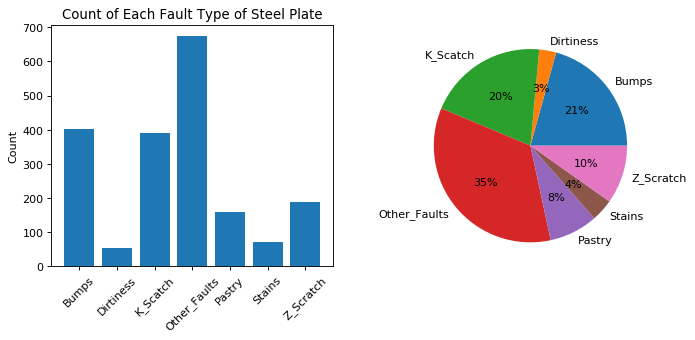

In [16]:
# use bar plot to show the number distribution of fault types
target_count = df.groupby('Class').size()
fig = plt.figure(figsize=(10,4),dpi=80) 
plt1 = fig.add_subplot(121) 
plt2 = fig.add_subplot(122) 
plt1.bar(target_count.index,target_count)
for tick in plt1.get_xticklabels():
    tick.set_rotation(45)
plt1.set_title('Count of Each Fault Type of Steel Plate')
plt1.set_ylabel('Count')

labels = target_count.index
plt2.pie(target_count, labels=labels, explode=[0,0,0,0,0,0,0],autopct='%1.0f%%')
plt.show()

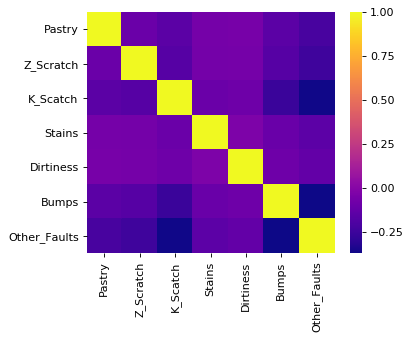

In [17]:
plt.figure(figsize=(5,4),dpi=80)
corr = targets.corr()
sns.heatmap(corr, xticklabels=corr.columns.values,yticklabels=corr.columns.values, cmap='plasma')
plt.show()

In [18]:
# get the class
df_class=df['Class'].copy()
# get all the attributes of the data
df_features = df.iloc[:,:-1].copy()

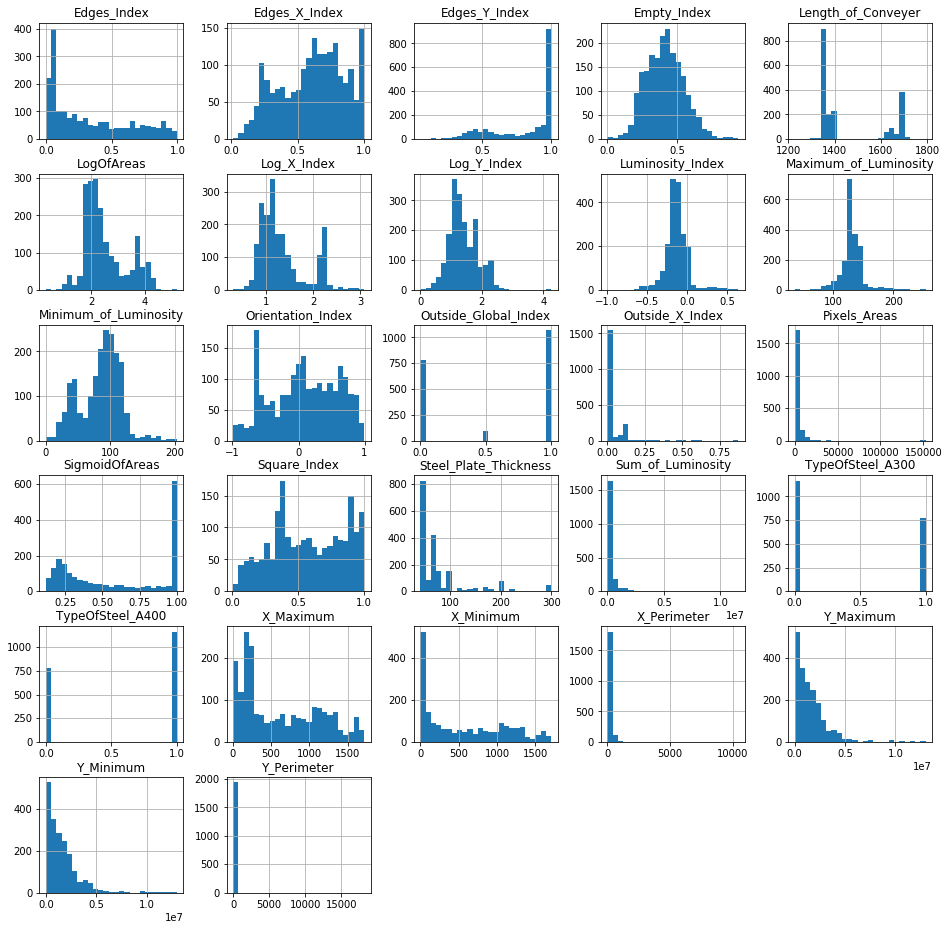

In [19]:
# Check distribution of every attribute across the data using histogram
df_features.hist(bins=25, figsize=(16,16))
plt.show()

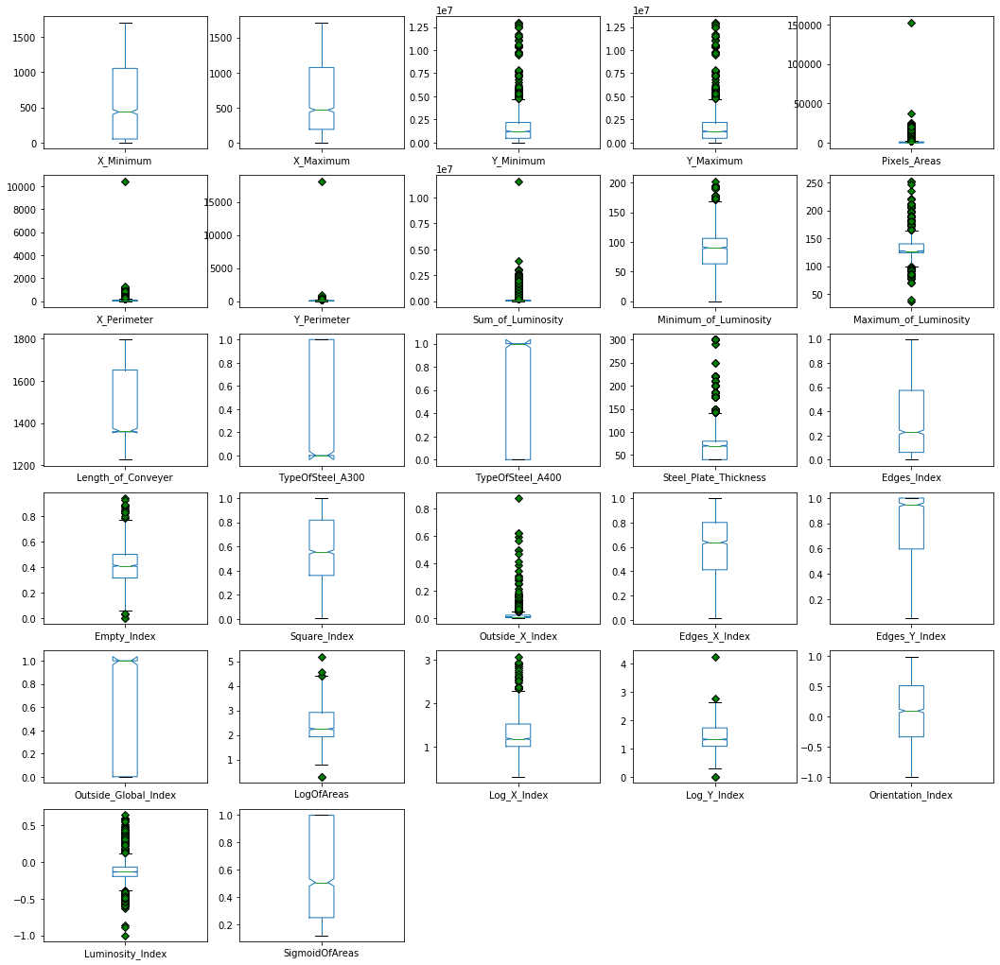

In [20]:
# check the value distribution of each attribute
green_diamond = dict(markerfacecolor='g', marker='D')
df_features.plot(kind='box', figsize=(18,18), layout=(6,5), notch=True, flierprops=green_diamond, subplots=True,sharex=False, sharey=False)
plt.show()

In [21]:
%%markdown
**Basic information of the original data**
1. There are totally 1941 pieces of data and 34 features.
2. There is no missing values in the data.
3. All of the features are in numeric format, among which 21 are of integer format and the rest 13 are of float.
4. The data has already been one-hot encoded, the seven class column and steeltype column.
5. The target of the data is not evenly distributed.
6. Some of the features have outliers. 

**Basic information of the original data**
1. There are totally 1941 pieces of data and 34 features.
2. There is no missing values in the data.
3. All of the features are in numeric format, among which 21 are of integer format and the rest 13 are of float.
4. The data has already been one-hot encoded, the seven class column and steeltype column.
5. The target of the data is not evenly distributed.
6. Some of the features have outliers. 


In [22]:
# df.groupby('Class').hist(figsize=(16,16))
# plt.show()

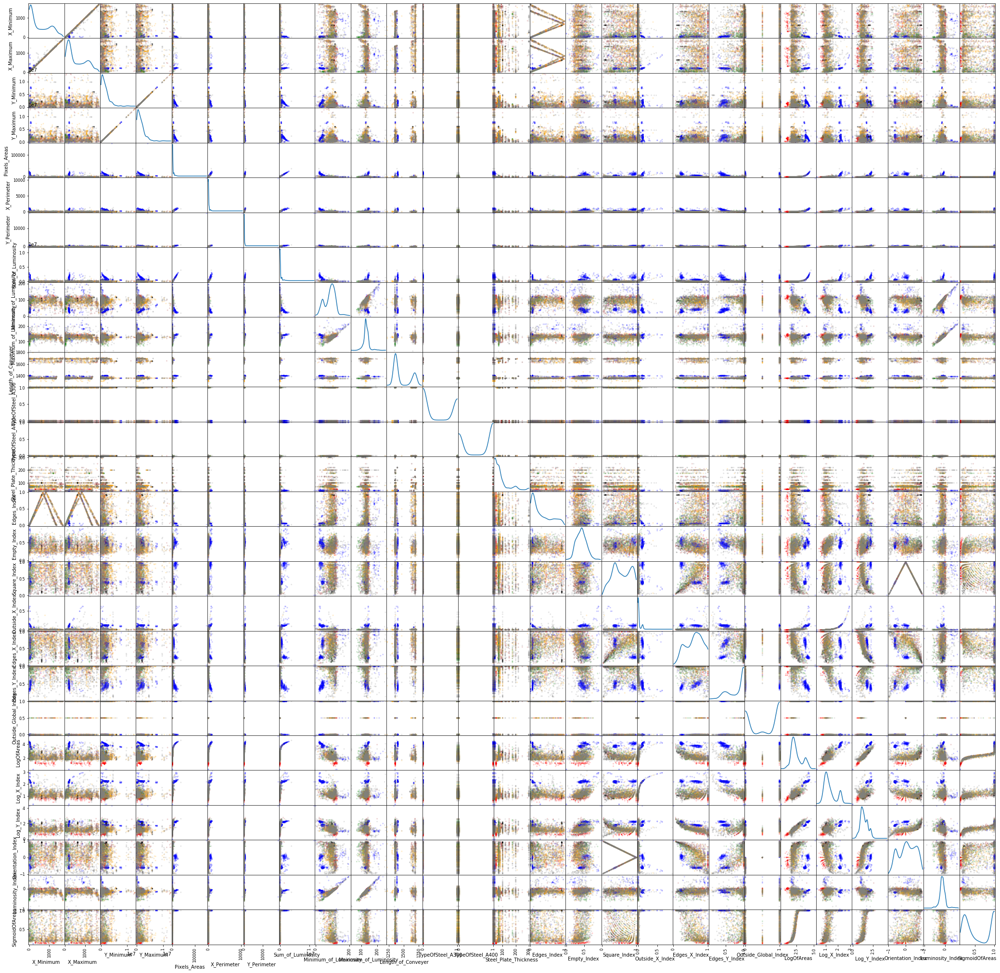

In [23]:
# Let's see the relationships between the Fault Type and each Attributes
from pandas.plotting import scatter_matrix
cmap = {'Pastry':'brown', 'Z_Scratch':'green', 'K_Scatch':'blue', 
        'Stains':'red', 'Dirtiness':'black', 'Bumps':'orange', 'Other_Faults':'gray'}
cmap = df_class.map(cmap)
scatter_matrix(df_features,alpha=0.2,c=cmap,figsize=(36,36),diagonal='kde')
plt.show()

In [24]:
# 1. location X, width direction
# 2. location Y, length diretion
df_x_mean = (df['X_Maximum'] + df['X_Minimum']) / 2 
df_y_mean = (df['Y_Maximum'] + df['Y_Minimum']) / 2

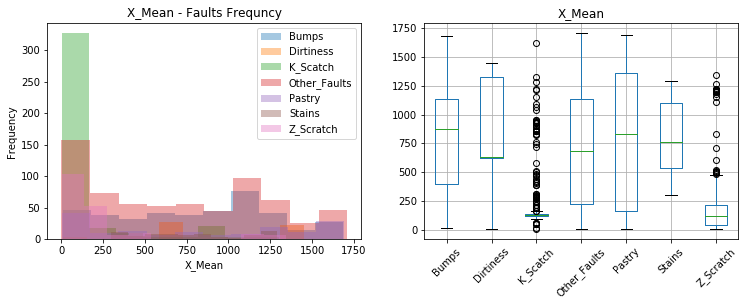

In [25]:
# Now we could check a Feature-Class Relationships between X_Mean and Class
df['X_Mean'] = df_x_mean
fig, axes = plt.subplots(1,2,figsize = (12,4))
df.groupby('Class')['X_Mean'].plot(kind='hist',ax=axes[0],alpha=0.4,legend=True,title='X_Mean - Faults Frequncy')
axes[0].set_xlabel('X_Mean')
df.boxplot(ax=axes[1], by='Class', column="X_Mean",rot=45)
axes[1].set_xlabel('')
plt.suptitle('')
plt.show()

In [26]:
cond_1 = df['X_Mean'] > 0
cond_2 = df['X_Mean'] < 200
faults_occurance_x_ratio_1 = df[cond_1 & cond_2].shape[0] / df.shape[0]
cond_3 = df['X_Mean'] > 1000 
cond_4 = df['X_Mean'] < 1350
faults_occurance_x_ratio_2 = df[cond_3 & cond_4].shape[0] / df.shape[0]
print('the ratio of faults occurance between [0, 200] is', faults_occurance_x_ratio_1)
print('the ratio of faults occurance before [100, 1350] is', faults_occurance_x_ratio_2)

the ratio of faults occurance between [0, 200] is 0.3766099948480165
the ratio of faults occurance before [100, 1350] is 0.19268418341061308


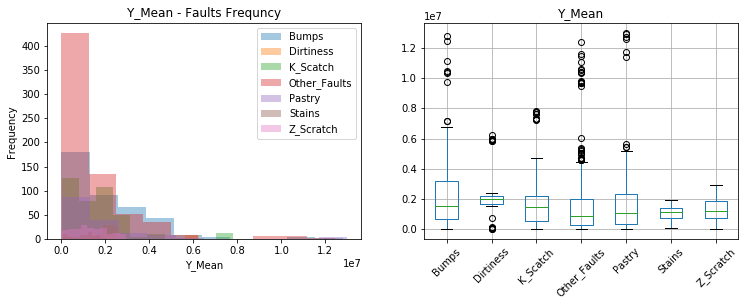

In [27]:
df['Y_Mean'] = df_y_mean
fig, axes = plt.subplots(1,2,figsize = (12,4))
df.groupby('Class')['Y_Mean'].plot(kind='hist',ax=axes[0],alpha=0.4,legend=True,title='Y_Mean - Faults Frequncy')
axes[0].set_xlabel('Y_Mean')
df.boxplot(ax=axes[1], by='Class', column="Y_Mean",rot=45)
axes[1].set_xlabel('')
plt.suptitle('')
plt.show()

In [28]:
# Get the ratio of faults occurance before 0.1 * 1e7
faults_occurance_y_ratio_1 = df[df['Y_Mean'] < 0.3 * 1e7].shape[0] / df.shape[0]
faults_occurance_y_ratio_2 = df[df['Y_Mean'] < 0.5 * 1e7].shape[0] / df.shape[0]
print('the ratio of faults occurance before 0.3 * 1e7 is', faults_occurance_y_ratio_1)
print('the ratio of faults occurance before 0.5 * 1e7 is', faults_occurance_y_ratio_2)

Y_Mean_range = df['Y_Mean'].max() - df['Y_Mean'].min() 
print('the ratio of most happened faults Y to Y range is', 0.5*1e7 / Y_Mean_range)

the ratio of faults occurance before 0.3 * 1e7 is 0.8686244204018547
the ratio of faults occurance before 0.5 * 1e7 is 0.9608449252962391
the ratio of most happened faults Y to Y range is 0.3851795689817512


In [29]:
%%markdown
**1. As we could see, the occurance locations of the faults on the plate show some patterns on both X and Y.**

For X
* There a big potion of it location in the range between [0, 200]
   Especially, a lot of faults form a linear strip region that near the X = 110 through all the length of the plate.
   We could name that most of faults here are K_Scatch, Z_Scatch, and the ratio of faults happens here is around 37%
* Another region with more faults is between [1000, 1350], with around 20% of faults happening here.

For Y
* More than 86% of faults happen before 0.3 * 1e7, and more than 96% happen before 0.5 * 1e7
* The length of 0.5 * 1e7 accounts for more than 38% of the total Y range, which means the faults happen mostly 
in the first half of the steel plate. 

From the following X_Mean - Y_Mean figure, we are able to have a detailed look of these patterns.

**1. As we could see, the occurance locations of the faults on the plate show some patterns on both X and Y.**

For X
* There a big potion of it location in the range between [0, 200]
   Especially, a lot of faults form a linear strip region that near the X = 110 through all the length of the plate.
   We could name that most of faults here are K_Scatch, Z_Scatch, and the ratio of faults happens here is around 37%
* Another region with more faults is between [1000, 1350], with around 20% of faults happening here.

For Y
* More than 86% of faults happen before 0.3 * 1e7, and more than 96% happen before 0.5 * 1e7
* The length of 0.5 * 1e7 accounts for more than 38% of the total Y range, which means the faults happen mostly 
in the first half of the steel plate. 

From the following X_Mean - Y_Mean figure, we are able to have a detailed look of these patterns.


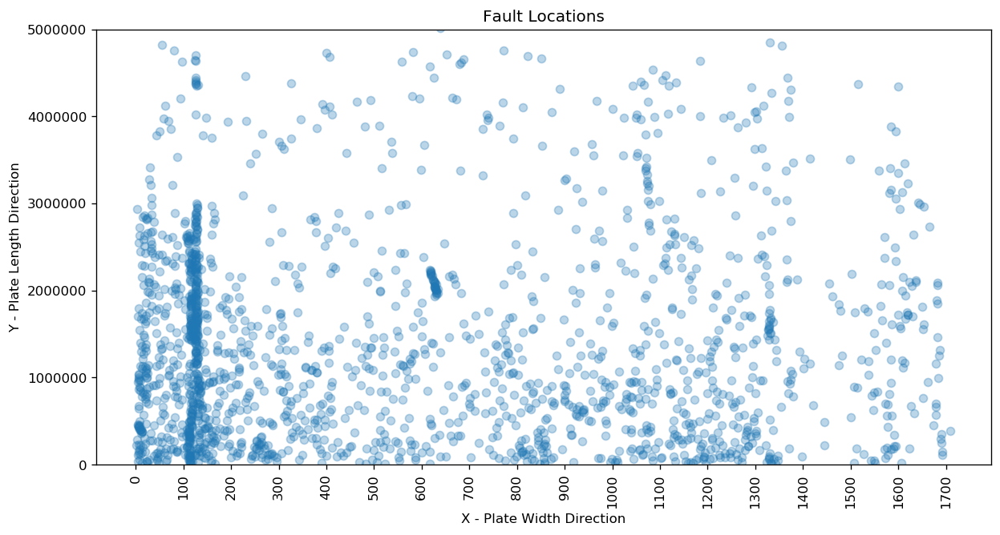

In [30]:
# show the position 
fig = plt.figure(figsize=(12,6), dpi=120)
plt.scatter(df_x_mean, df_y_mean,alpha=0.3)
plt.title('Fault Locations')
plt.xticks(np.arange(0,1750,100), rotation='vertical')
plt.xlabel('X - Plate Width Direction')
plt.ylabel('Y - Plate Length Direction')
axes = plt.gca()
# limit the y to 0.5 * 1e7, since more than 96% of default happens before 0.3 * 1e7
axes.set_ylim([0.0,0.5*1e7])
plt.show()

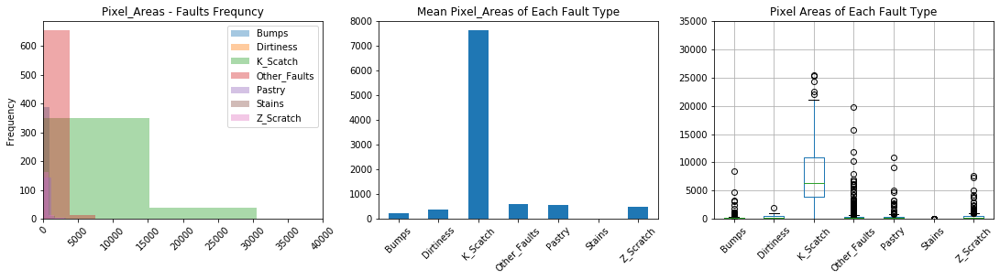

In [31]:
# 2. Pixels Areas
fig,axes = plt.subplots(1,3,figsize=(18,4))
df.groupby('Class')['Pixels_Areas'].plot(kind='hist',ax=axes[0],alpha=0.4,rot=45,legend=True,title='Pixel_Areas - Faults Frequncy')
axes[0].set_xlim([0,40000])
Pixel_Areas = df.groupby("Class")["Pixels_Areas"].agg(["mean"])
Pixel_Areas.plot.bar(ax=axes[1], rot=45,legend=False, title='Mean Pixel_Areas of Each Fault Type')
axes[1].set_xlabel('')
df.boxplot(ax=axes[2],by='Class', column="Pixels_Areas",figsize=(6,4),rot=45)
axes[2].set_title('Pixel Areas of Each Fault Type')
axes[2].set_xlabel('')
axes[2].set_ylim([0.0,35000])
plt.suptitle("")
plt.show()

In [32]:
%%markdown
**2. Relationship between Pixel Areas and the Fault Types.**
* We could see K-Scatch has a relatively larger area than all other faults.
* K_Scatch has a larger distribution of Pixel Areas, from 0 up to more than 20000.
* Stains has a very small area that its mean value is almost 0.

**2. Relationship between Pixel Areas and the Fault Types.**
* We could see K-Scatch has a relatively larger area than all other faults.
* K_Scatch has a larger distribution of Pixel Areas, from 0 up to more than 20000.
* Stains has a very small area that its mean value is almost 0.


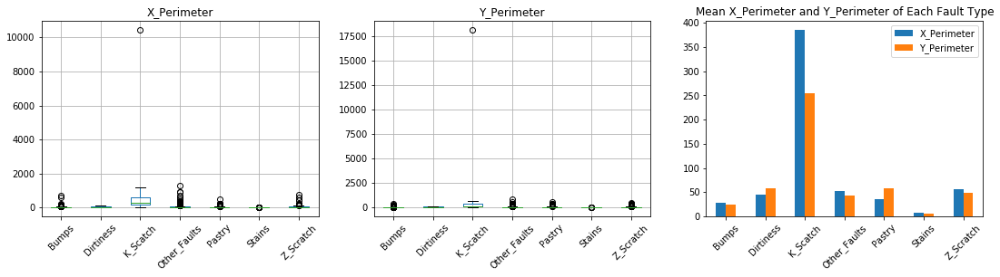

In [33]:
# 3. X_Perimeter and Y_Perimeter
fig,axes=plt.subplots(1,3,figsize=(18,4))
df.boxplot(ax=axes[0],by='Class', column=["X_Perimeter"],rot=45)
axes[0].set_xlabel('')
df.boxplot(ax=axes[1],by='Class', column=["Y_Perimeter"],rot=45)
axes[1].set_xlabel('')
X_Perimeter = df.groupby("Class")["X_Perimeter"].agg(["mean"])
Y_Perimeter = df.groupby("Class")["Y_Perimeter"].agg(["mean"])
Perimeter = pd.concat([X_Perimeter, Y_Perimeter], axis=1)
Perimeter.plot.bar(ax=axes[2], rot=45,title='Mean X_Perimeter and Y_Perimeter of Each Fault Type')
axes[2].set_xlabel('')
axes[2].legend(('X_Perimeter','Y_Perimeter'))
plt.suptitle("")
plt.show()

In [34]:
%%markdown
**3. Relationship between X perimeter and Y perimeter with the Fault Types.**
* We could see K-Scatch has a relatively higher X perimeter and Y perimeter, and its mean X perimeter is larger
than Y perimeter. 
* Stains has a very small perimeter on both X and Y direction.

This two pattern does in compliance with our finding on Pixel Area. 

**3. Relationship between X perimeter and Y perimeter with the Fault Types.**
* We could see K-Scatch has a relatively higher X perimeter and Y perimeter, and its mean X perimeter is larger
than Y perimeter. 
* Stains has a very small perimeter on both X and Y direction.

This two pattern does in compliance with our finding on Pixel Area. 


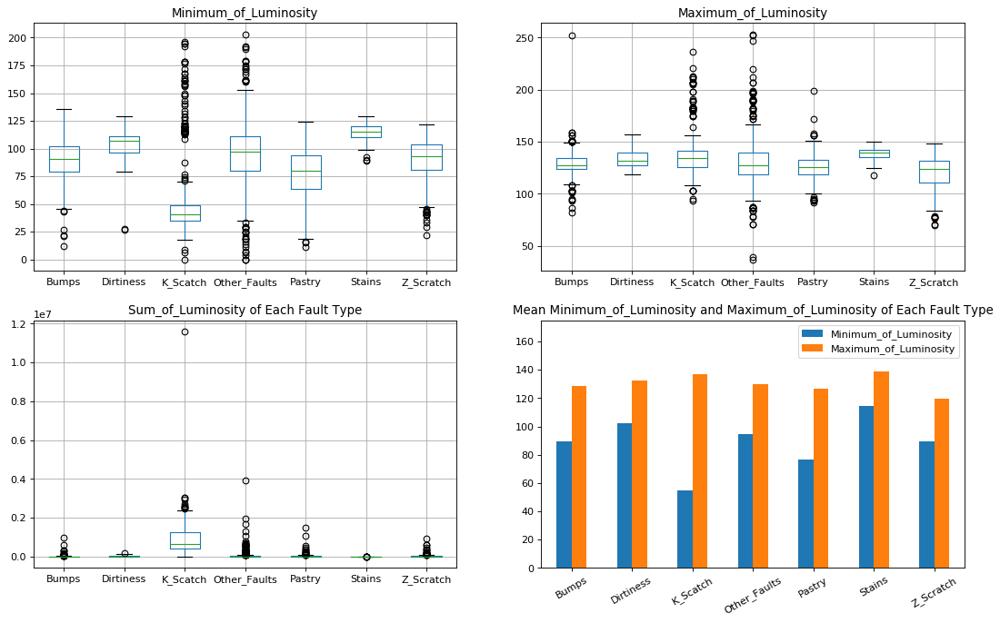

In [35]:
# 4. Luminosity
fig,axes = plt.subplots(2,2,figsize=(16,10),dpi=80)
df.boxplot(ax=axes[0,0],by='Class',column=["Minimum_of_Luminosity"],rot=0)
axes[0,0].set_xlabel('')
df.boxplot(ax=axes[0,1],by='Class',column=["Maximum_of_Luminosity"],rot=0)
axes[0,1].set_xlabel('')
df.boxplot(ax=axes[1,0],by='Class', column="Sum_of_Luminosity",rot=0)
axes[1,0].set_title('Sum_of_Luminosity of Each Fault Type')
axes[1,0].set_xlabel('')
Minimum_of_Luminosity = df.groupby("Class")["Minimum_of_Luminosity"].agg(["mean"])
Maximum_of_Luminosity = df.groupby("Class")["Maximum_of_Luminosity"].agg(["mean"])
Luminosity = pd.concat([Minimum_of_Luminosity, Maximum_of_Luminosity], axis=1)
Luminosity.plot.bar(ax=axes[1,1], rot=30, title='Mean Minimum_of_Luminosity and Maximum_of_Luminosity of Each Fault Type')
axes[1,1].legend(('Minimum_of_Luminosity','Maximum_of_Luminosity'))
axes[1,1].set_ylim([0, 175])
axes[1,1].set_xlabel("")
plt.suptitle("")
plt.show()

In [36]:
%%markdown
**4. Relationship between Sum of Luminosity with the Fault Types.**
* we could see that the sum of luminosity of K_Scatch is larger than the others, while its maximum of luminosity is
of the same level of the others', so it is partly because of its relatively larger Pixel Areas. 
* K_Scatch has the biggest scale of luminosity, and stain has the smallest scale of luminosity.

**4. Relationship between Sum of Luminosity with the Fault Types.**
* we could see that the sum of luminosity of K_Scatch is larger than the others, while its maximum of luminosity is
of the same level of the others', so it is partly because of its relatively larger Pixel Areas. 
* K_Scatch has the biggest scale of luminosity, and stain has the smallest scale of luminosity.


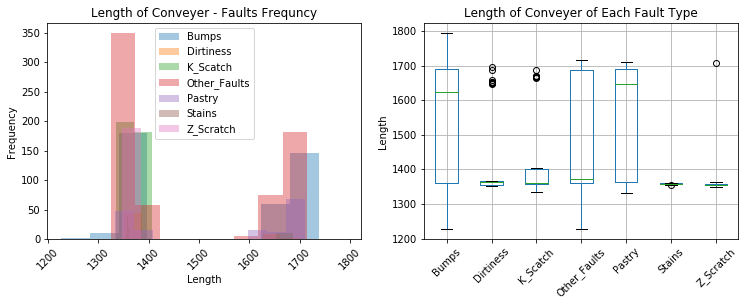

In [37]:
# 5. Length of Conveyer
fig,axes=plt.subplots(1,2,figsize=(12,4))
df.groupby('Class')['Length_of_Conveyer'].plot(kind='hist',ax=axes[0],alpha=0.4,rot=45,legend=True,title='Length of Conveyer - Faults Frequncy')
axes[0].set_xlabel("Length")
df.boxplot(ax=axes[1],by='Class', column="Length_of_Conveyer",figsize=(6,4),rot=45)
axes[1].set_title('Length of Conveyer of Each Fault Type')
axes[1].set_xlabel("")
axes[1].set_ylabel("Length")
plt.suptitle("")
plt.show()

In [38]:
%%markdown
**5. Relation of Length of Conveyer with Fault Types**
* we could see that Bumps, Pastry and Other Faults have a larger scale of distribution on length of conveyer. 
* All of the other four occur when the conveyer's length is in the range of 1350 to 1400

**5. Relation of Length of Conveyer with Fault Types**
* we could see that Bumps, Pastry and Other Faults have a larger scale of distribution on length of conveyer. 
* All of the other four occur when the conveyer's length is in the range of 1350 to 1400


In [39]:
# 6. Steel Type
# Here let's dig into the patter we are assuming above.
# Transfer the one hot encoded steel type back to one column, which will help us better understand the data initially.
df_features.drop(['TypeOfSteel_A400', 'TypeOfSteel_A300'], axis=1, inplace=True)
steel_types = df[['TypeOfSteel_A300','TypeOfSteel_A400']].copy()
steel_types = (steel_types == 1).idxmax(1)
df_features['Steel_Type'] = steel_types

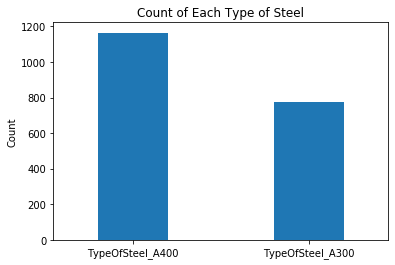

TypeOfSteel_A400    1164
TypeOfSteel_A300     777
dtype: int64


In [40]:
ax = steel_types.value_counts().plot(kind='bar', width=0.4, figsize=(6,4),rot=0, title='Count of Each Type of Steel')
ax.set_ylabel("Count")
plt.show()
print(steel_types.value_counts())

In [41]:
df = [df_features, df_class]
df = pd.concat(df, axis=1)
df['Steel_Type'] = df['Steel_Type'].str.replace('TypeOfSteel_', '')
df.head()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Steel_Type,Class
0,42,50,270900,270944,267,17,44,24220,76,108,...,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822,A300,Pastry
1,645,651,2538079,2538108,108,10,30,11397,84,123,...,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984,A300,Pastry
2,829,835,1553913,1553931,71,8,19,7972,99,125,...,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150,A300,Pastry
3,853,860,369370,369415,176,13,45,18996,99,126,...,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212,A400,Pastry
4,1289,1306,498078,498335,2409,60,260,246930,37,126,...,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000,A400,Pastry


In [42]:
steel_type_fault_counts=df.groupby(['Steel_Type','Class']).size()
steel_type_fault_counts = pd.concat([steel_type_fault_counts['A300'],steel_type_fault_counts['A400']], axis=1)

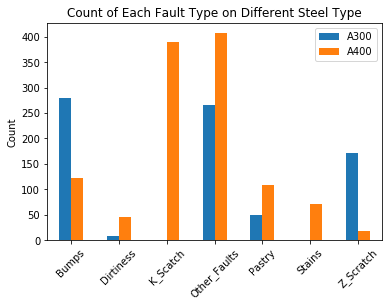

In [43]:
ax=steel_type_fault_counts.plot.bar(rot=45)
ax.set_title('Count of Each Fault Type on Different Steel Type')
ax.legend(('A300', 'A400'))
ax.set_xlabel('')
ax.set_ylabel('Count')
plt.show()

In [44]:
%%markdown
**6. Relation of Steel Type with Fault Types**
* Most instances of K Scatch and stains happen in A400 steel.
* While most instances of Z Scatch happen in A300 steel.
* More bumps happen in A300 than A400.
* More Dirtiness and Pastery happen in A400 than A300.

**6. Relation of Steel Type with Fault Types**
* Most instances of K Scatch and stains happen in A400 steel.
* While most instances of Z Scatch happen in A300 steel.
* More bumps happen in A300 than A400.
* More Dirtiness and Pastery happen in A400 than A300.


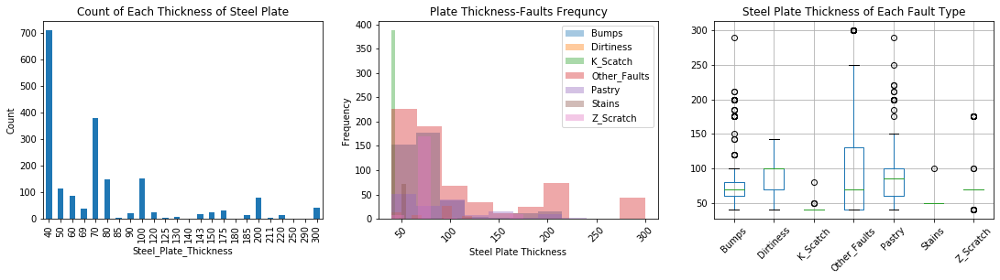

In [45]:
# 7. Steel Plate Thickness
fig,axes=plt.subplots(1,3,figsize=(18,4))
Steel_Plate_Thickness = df.groupby('Steel_Plate_Thickness').size()
Steel_Plate_Thickness.plot(kind='bar',ax=axes[0])
axes[0].set_title('Count of Each Thickness of Steel Plate')
axes[0].set_ylabel('Count')
df.groupby('Class')['Steel_Plate_Thickness'].plot(kind='hist',ax=axes[1],alpha=0.4,rot=45,legend=True,title='Plate Thickness-Faults Frequncy')
axes[1].set_xlabel('Steel Plate Thickness')
df.boxplot(by='Class',ax=axes[2],column="Steel_Plate_Thickness",rot=45)
axes[2].set_title('Steel Plate Thickness of Each Fault Type')
axes[2].set_xlabel('')
plt.suptitle('')
plt.show()

In [46]:
%%markdown
**6. Relation of Steel Type with Fault Types**
* A lot of plates have thickness of 40 and 70.
* K Scatch mostly happen in plates with thickness of smaller than 50.
* Stains mostly occur in plates with thickness of around 50.
* While Z Scatch happen thickness of around 70.
* Bumps, Dirtiness and Pastery happen in plates with thickness between 50 and 100.

From the relationship of steel type and thicking, we could assume that Scatch Faults and Stains Fault are steel type 
and thickness related, that the K Scatch mostly happen in the A400 steel plate whose thickness is smaller than 50. 
However, Z Scatch mostly happen in A300 plate whose thickness is around 70. Meanwhile, we could also assume that 
Stains happen mostly in A400 plate with a thickness around 50.

**6. Relation of Steel Type with Fault Types**
* A lot of plates have thickness of 40 and 70.
* K Scatch mostly happen in plates with thickness of smaller than 50.
* Stains mostly occur in plates with thickness of around 50.
* While Z Scatch happen thickness of around 70.
* Bumps, Dirtiness and Pastery happen in plates with thickness between 50 and 100.

From the relationship of steel type and thicking, we could assume that Scatch Faults and Stains Fault are steel type 
and thickness related, that the K Scatch mostly happen in the A400 steel plate whose thickness is smaller than 50. 
However, Z Scatch mostly happen in A300 plate whose thickness is around 70. Meanwhile, we could also assume that 
Stains happen mostly in A400 plate with a thickness around 50.


In [47]:
# Here let's dig into the patter we are assuming above.
steel_type_thickness_mean = df.groupby(['Steel_Type','Class'])['Steel_Plate_Thickness'].agg(["mean"])
steel_type_thickness_mean = pd.concat([steel_type_thickness_mean.loc['A300'],steel_type_thickness_mean.loc['A400']], axis=1)

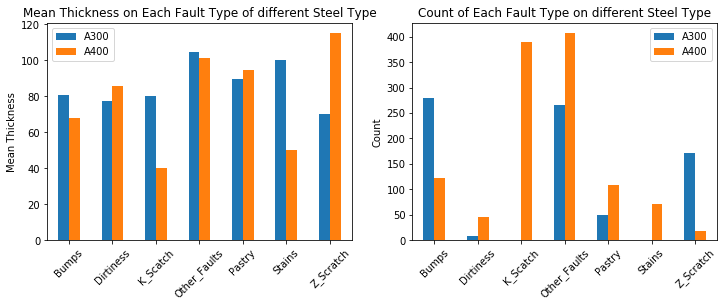

In [48]:
fig,axes=plt.subplots(1,2,figsize=(12,4))
steel_type_thickness_mean.plot.bar(ax=axes[0],rot=45)
axes[0].legend(('A300','A400'))
axes[0].set_title('Mean Thickness on Each Fault Type of different Steel Type')
axes[0].set_xlabel('')
axes[0].set_ylabel('Mean Thickness')
steel_type_fault_counts=df.groupby(['Steel_Type','Class']).size()
steel_type_fault_counts = pd.concat([steel_type_fault_counts['A300'],steel_type_fault_counts['A400']], axis=1)
steel_type_fault_counts.plot.bar(ax=axes[1],rot=45)
axes[1].legend(('A300','A400'))
axes[1].set_title('Count of Each Fault Type on different Steel Type')
axes[1].set_xlabel('')
axes[1].set_ylabel('Count')
plt.show()

In [49]:
%%markdown
As we could see that the thickness that occur faults do have relationship with steel type:  
* K Scatch mostly happen in the A400 steel plate whose thickness is 40. 
* Z Scatch mostly happen in A300 plate whose thickness is 70. 
* Stains happen mostly in A400 plate with a thickness is 50.

As we could see that the thickness that occur faults do have relationship with steel type:  
* K Scatch mostly happen in the A400 steel plate whose thickness is 40. 
* Z Scatch mostly happen in A300 plate whose thickness is 70. 
* Stains happen mostly in A400 plate with a thickness is 50.


In [50]:
# 7. Different Indices

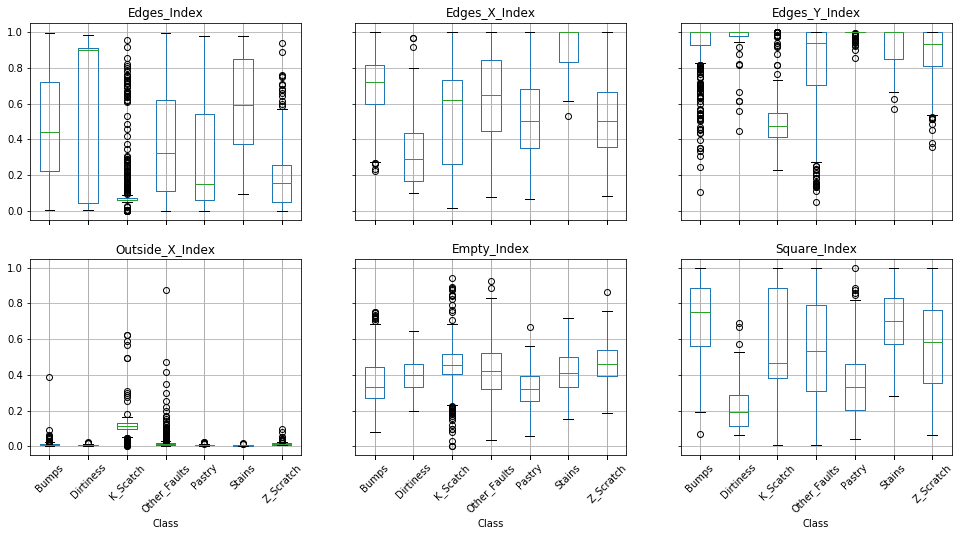

In [51]:
df.boxplot(by='Class', column=["Edges_Index",'Edges_X_Index','Edges_Y_Index','Outside_X_Index', 
                               "Empty_Index","Square_Index"],figsize=(16,8),layout=(2,3), rot=45)
plt.suptitle('')
plt.show()

In [52]:
%%markdown
**As we could see these indices has the following patterns:**  
* For Edges Index, K Scatch is well centered around 0.08.
* For Edges X Index, Stains are more close to 1.
* For Edges Y Index, Bumps, Dirtiness, Pastry, Stains and Z_Scacth are very close to 1.
* For Outside X Index, K_Scatch has a larger value than all the others.
* For Empty Index, All of the faults have values around 0.4
* For Square Index, Dirtines and Pastry have a lower value than 0.5, while all the others have values over 0.5

**As we could see these indices has the following patterns:**  
* For Edges Index, K Scatch is well centered around 0.08.
* For Edges X Index, Stains are more close to 1.
* For Edges Y Index, Bumps, Dirtiness, Pastry, Stains and Z_Scacth are very close to 1.
* For Outside X Index, K_Scatch has a larger value than all the others.
* For Empty Index, All of the faults have values around 0.4
* For Square Index, Dirtines and Pastry have a lower value than 0.5, while all the others have values over 0.5


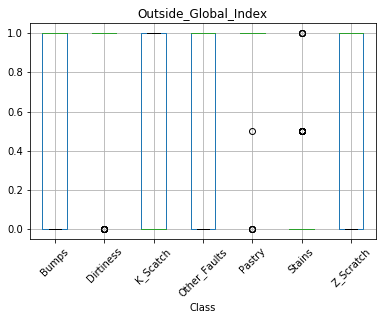

In [53]:
df.boxplot(by='Class', column=["Outside_Global_Index"],figsize=(6,4), rot=45)
plt.suptitle('')
plt.show()

In [54]:
%%markdown
**As we could see these Outside Global Index has the following patterns:**  
* Dirtiness, Pastry has 1.0 values, while Stains has a 0 values, and all the others have values across 0 to 1.

**As we could see these Outside Global Index has the following patterns:**  
* Dirtiness, Pastry has 1.0 values, while Stains has a 0 values, and all the others have values across 0 to 1.


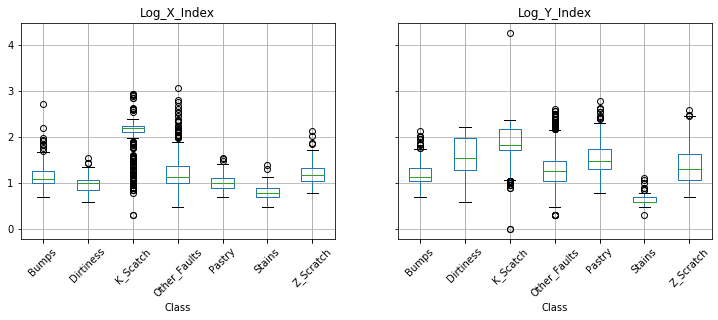

In [55]:
df.boxplot(by='Class', column=['Log_X_Index','Log_Y_Index'],figsize=(12,4),layout=(1,2), rot=45)
plt.suptitle('')
plt.show()

In [56]:
%%markdown
**As we could see these Log X Index and Log Y Index has the following patterns:**  
* For Log X Index, K_Scatch has a larger value, while all the others have a value around 1.
* For Log Y Index, K_Scatch is of larger value, and all the others have a value ranging from 0.5 to 2.

**As we could see these Log X Index and Log Y Index has the following patterns:**  
* For Log X Index, K_Scatch has a larger value, while all the others have a value around 1.
* For Log Y Index, K_Scatch is of larger value, and all the others have a value ranging from 0.5 to 2.


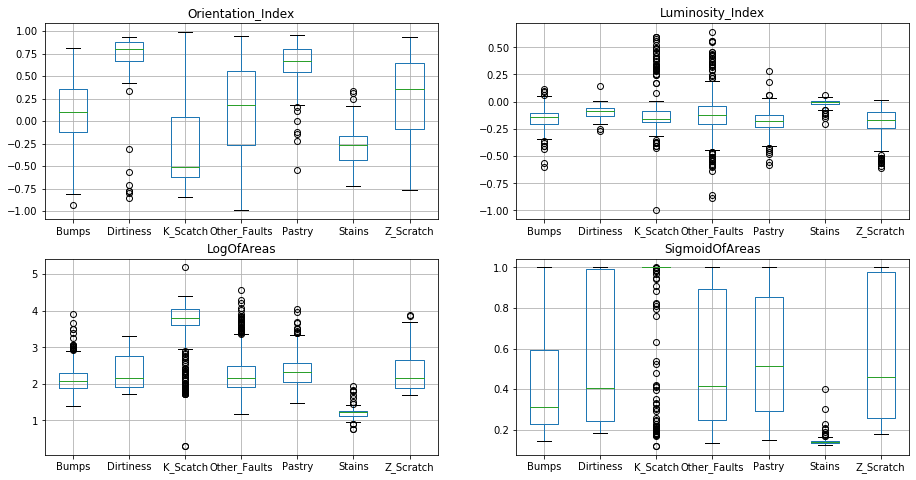

In [57]:
fig,axes=plt.subplots(2,2,figsize=(15,8))
df.boxplot(by='Class',ax=axes[0,0],column='Orientation_Index',rot=0)
axes[0,0].set_xlabel('')
df.boxplot(by='Class',ax=axes[0,1],column='Luminosity_Index',rot=0)
axes[0,1].set_xlabel('')
df.boxplot(by='Class',ax=axes[1,0],column='LogOfAreas',rot=0)
axes[1,0].set_xlabel('')
df.boxplot(by='Class',ax=axes[1,1],column='SigmoidOfAreas',rot=0)
axes[1,1].set_xlabel('')
plt.suptitle('')
plt.show()

In [58]:
%%markdown
**As we could see these Orientation and Luminosity Index has the following patterns:**  
* For Orientation Index, K_Scatch and Stains are mostly negetive, while all the others are mostly positive.
* For Luminosity Index, Stains has a value very close to 0, and all the others have a value ranging from 0 to -0.25.

**As we could see these Orientation and Luminosity Index has the following patterns:**  
* For Orientation Index, K_Scatch and Stains are mostly negetive, while all the others are mostly positive.
* For Luminosity Index, Stains has a value very close to 0, and all the others have a value ranging from 0 to -0.25.


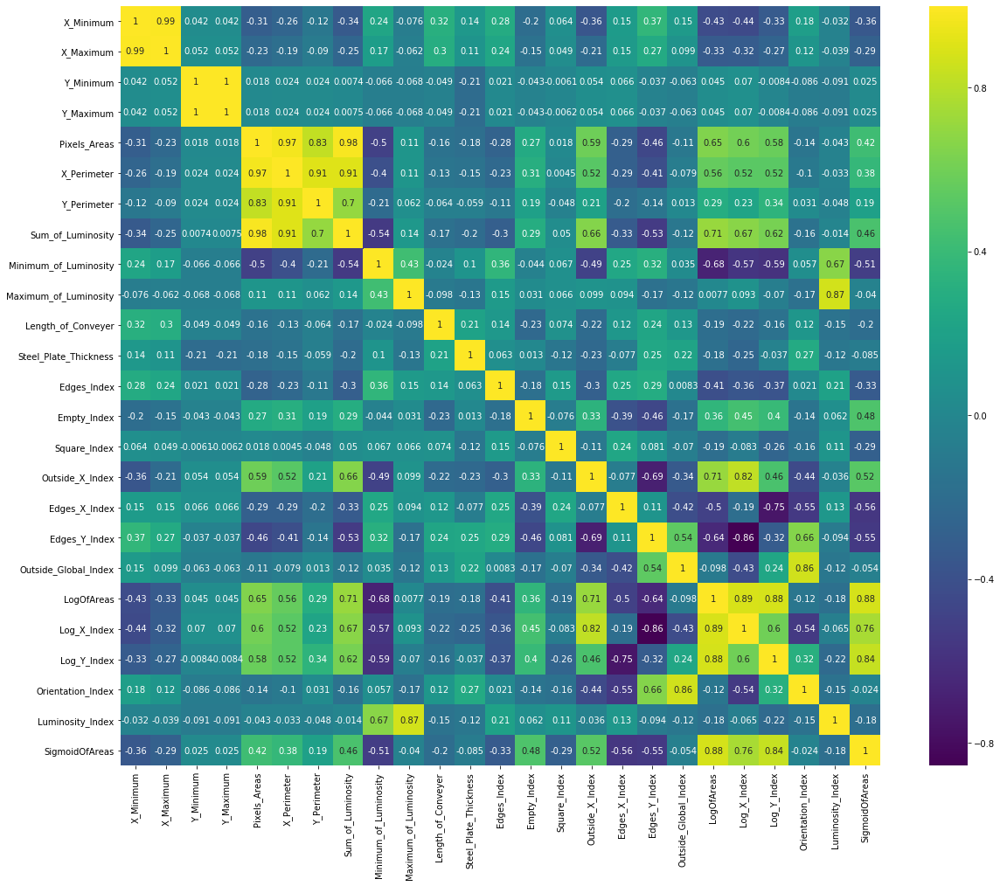

In [59]:
# Feature-Feature Relationships
plt.figure(figsize=(20,16))
sns.heatmap(df_features.corr(), cmap='viridis',square=True,annot=True,cbar=True)
plt.show()

In [60]:
# get the highest correlated features
corr_matrix = df_features.corr().abs()
corr_features = []
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > 0.95:
            colname = corr_matrix.columns[i]
            corr_features.append(colname)
print(corr_features)

['X_Maximum', 'Y_Maximum', 'X_Perimeter', 'Sum_of_Luminosity']


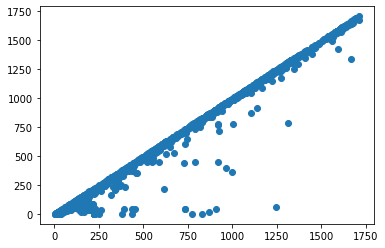

In [61]:
plt.scatter('X_Maximum', 'X_Minimum', data=df_features)
plt.show()

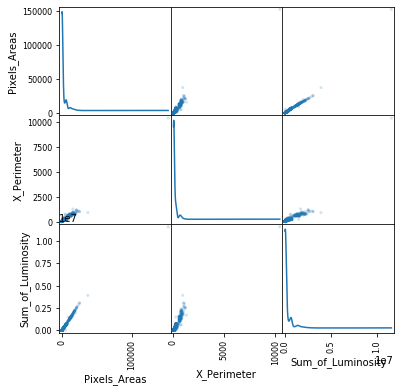

In [62]:
scatter_matrix(df_features[['Pixels_Areas','X_Perimeter','Sum_of_Luminosity']],
               alpha=0.2,figsize=(6,6),diagonal='kde')
plt.show()

In [63]:
%%markdown
** Feature - Feature Relationship **
1. As we could see from the heatmap that the features are not totally independent, the yellowest features are 
more correlated with each other, such as X_Maximum and X_Minimum, Y_Maximum and Y_Minimum and the other three 
features that are obviously correlated are Pixel Areas, X Perimeters and Sum of Luminosity.
2. We find there is a linear relationship between these features by drawing plots and scatter matrix between them. 
3. Finally, we could calculating the correlated matrix and get the 5 features with score of more than 0.95, they are 
'X_Maximum', 'Y_Maximum', 'X_Perimeter', 'Sum_of_Luminosity', 'TypeOfSteel_A400'

** Feature - Feature Relationship **
1. As we could see from the heatmap that the features are not totally independent, the yellowest features are 
more correlated with each other, such as X_Maximum and X_Minimum, Y_Maximum and Y_Minimum and the other three 
features that are obviously correlated are Pixel Areas, X Perimeters and Sum of Luminosity.
2. We find there is a linear relationship between these features by drawing plots and scatter matrix between them. 
3. Finally, we could calculating the correlated matrix and get the 5 features with score of more than 0.95, they are 
'X_Maximum', 'Y_Maximum', 'X_Perimeter', 'Sum_of_Luminosity', 'TypeOfSteel_A400'


In [64]:
# find the most impacting features.
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest

In [65]:
# features
X = data.copy()
X.drop(['Pastry','Z_Scratch','K_Scatch','Stains','Dirtiness','Bumps','Other_Faults'],axis=1,inplace=True)
# drop the correlated features.
X.drop(corr_features,axis=1,inplace=True)

In [66]:
# transform the class
from sklearn.preprocessing import LabelEncoder
# merge the target into one column.
targets = data.iloc[:, -7:].copy()
target = (targets == 1).idxmax(1)
le = LabelEncoder()
le.fit(target)
# get the mapping
le_name_mapping = dict(zip(le.transform(le.classes_), le.classes_))
print(le_name_mapping)
y = le.transform(target)

{0: 'Bumps', 1: 'Dirtiness', 2: 'K_Scatch', 3: 'Other_Faults', 4: 'Pastry', 5: 'Stains', 6: 'Z_Scratch'}


In [67]:
df = X.copy()
df['Class'] = y

In [68]:
# estimate the mutual information between the numeric features and the class column
mi = mutual_info_classif(X, y)
mi

array([0.49576198, 0.09210228, 0.4392103 , 0.38177728, 0.39814395,
       0.1620949 , 0.53505335, 0.22247201, 0.21701595, 0.60037239,
       0.37759584, 0.13410263, 0.29291305, 0.52613297, 0.22432691,
       0.35338429, 0.10431246, 0.43678975, 0.39042813, 0.3625996 ,
       0.41791526, 0.2119303 , 0.37006937])

In [69]:
mi_infos=pd.DataFrame(mi)
# rename the column as score
mi_infos.rename(columns={0: 'score'},inplace=True)
# add the original feature name as a new column.
mi_infos['feature'] = pd.DataFrame(X.columns)
# sort the new dataframe by score in descending order.
mi_infos.sort_values(by='score',ascending=False).head(6)

,score,feature
9,0.600372,Steel_Plate_Thickness
6,0.535053,Length_of_Conveyer
13,0.526133,Outside_X_Index
0,0.495762,X_Minimum
2,0.439210,Pixels_Areas
17,0.436790,LogOfAreas


In [70]:
# Select the k best features.
best_feature_num = 6
selector = SelectKBest(mutual_info_classif, k=best_feature_num)
selector.fit(X, y)
# Get indices of columns to keep.
idxs_selected = selector.get_support(indices=True)
# Create new DataFrame with only desired columns.
X_new = X.iloc[:, idxs_selected]
# Show the best features.
X_new.head(6)

,X_Minimum,Pixels_Areas,Length_of_Conveyer,Steel_Plate_Thickness,Outside_X_Index,LogOfAreas
0,42,267,1687,80,0.0047,2.4265
1,645,108,1687,80,0.0036,2.0334
2,829,71,1623,100,0.0037,1.8513
3,853,176,1353,290,0.0052,2.2455
4,1289,2409,1353,185,0.0126,3.3818
5,430,630,1387,40,0.0079,2.7993


In [71]:
df_most_important_features = df[X_new.columns.values]
df_most_important_features.columns

Index(['X_Minimum', 'Pixels_Areas', 'Length_of_Conveyer',
       'Steel_Plate_Thickness', 'Outside_X_Index', 'LogOfAreas'],
      dtype='object')

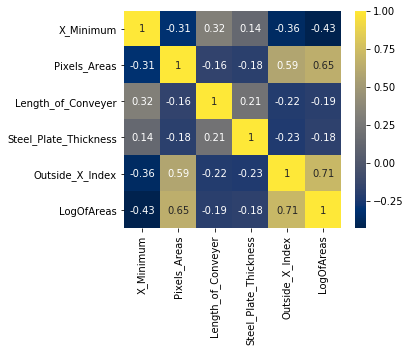

In [72]:
plt.figure(figsize=(5,4))
sns.heatmap(df_most_important_features.corr(),cmap='cividis',square=True,annot=True,cbar=True)
plt.show()

In [73]:
df_show = [df_most_important_features, target]
df_show = pd.concat(df_show, axis=1)
df_show.rename(columns={0:'Class'}, inplace=True)
df_show.head()

,X_Minimum,Pixels_Areas,Length_of_Conveyer,Steel_Plate_Thickness,Outside_X_Index,LogOfAreas,Class
0,42,267,1687,80,0.0047,2.4265,Pastry
1,645,108,1687,80,0.0036,2.0334,Pastry
2,829,71,1623,100,0.0037,1.8513,Pastry
3,853,176,1353,290,0.0052,2.2455,Pastry
4,1289,2409,1353,185,0.0126,3.3818,Pastry


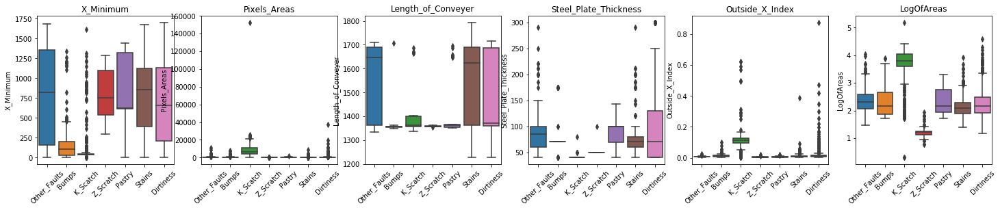

In [74]:
rows, cols = 1, best_feature_num
fig, axes = plt.subplots(rows, cols, figsize=(25,4))
labels = df_show['Class'].value_counts().index.values
columns = df_show.columns
cnt = 0
for r in range(rows):
    for c in range(cols):
        sns.boxplot(x='Class', y=columns[cnt], data=df_show, ax=axes[c])
        axes[c].set_title(columns[cnt])
        axes[c].set_xticklabels(labels=labels,rotation=45)
        axes[c].set_xlabel('')
        cnt += 1  

In [75]:
%%markdown
1. The top 6 import features are X_Minimum', 'Pixels_Areas', 'Length_of_Conveyer','Steel_Plate_Thickness', 'Outside_X_Index', 'LogOfAreas.
2. The result is in compliance with our observation above that the fault types has a strong relationship with these
six features.
3. Most of these 6 import features has relatively lower correlations.
4. We could easily see the distribution of the fault types in these features. 

1. The top 6 import features are X_Minimum', 'Pixels_Areas', 'Length_of_Conveyer','Steel_Plate_Thickness', 'Outside_X_Index', 'LogOfAreas.
2. The result is in compliance with our observation above that the fault types has a strong relationship with these
six features.
3. Most of these 6 import features has relatively lower correlations.
4. We could easily see the distribution of the fault types in these features. 


In [76]:
%%markdown
# 3. Data preprocessing
1. standardize data
2. deal with outliers

# 3. Data preprocessing
1. standardize data
2. deal with outliers


In [77]:
df = data.copy()

In [78]:
df_features = df.iloc[:,:-7]

In [79]:
df_features.head(1)

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
0,42,50,270900,270944,267,17,44,24220,76,108,...,0.0047,0.4706,1.0,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822


In [80]:
# standardize
from sklearn import preprocessing as pp
scaler = pp.StandardScaler()
df_features = pd.DataFrame(scaler.fit_transform(df.iloc[:,:-7]), columns=df.iloc[:,:-7].columns)

In [81]:
df_features.head(1)

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
0,-1.016481,-1.141639,-0.777729,-0.777729,-0.314852,-0.314996,-0.091389,-0.355537,-0.266099,-1.187708,...,-0.486227,-0.575331,0.796401,0.879804,-0.083538,-0.898437,0.528872,1.467656,-1.075752,-0.00949


In [82]:
df_class = df.iloc[:,-7:]

In [83]:
print(df_features.shape, df_class.shape)

(1941, 27) (1941, 7)


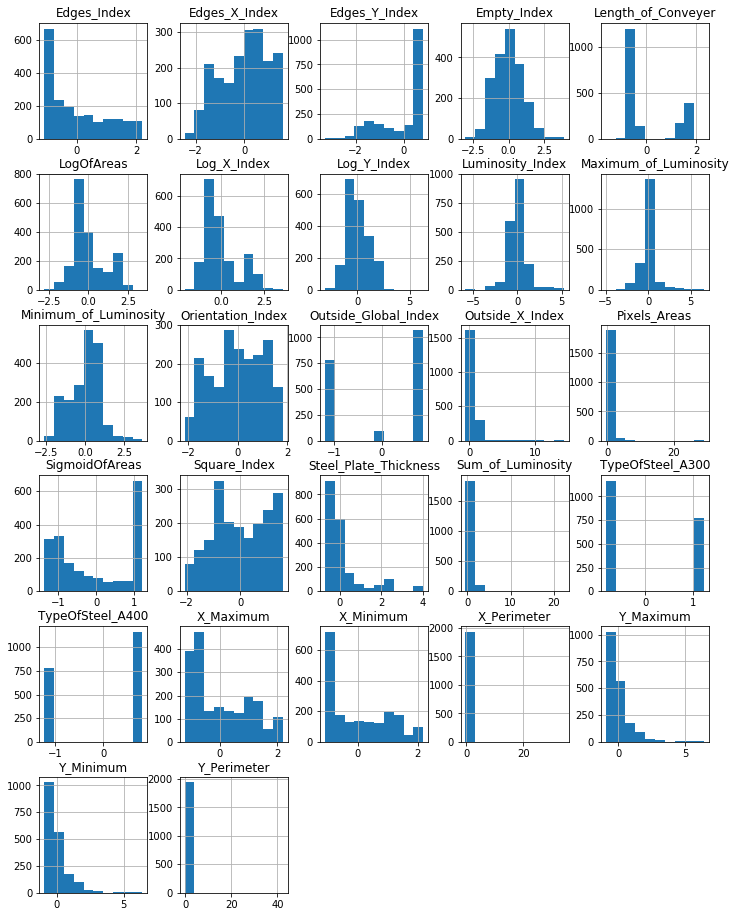

In [84]:
# check the distribution of the standardized data.
df_features.hist(figsize=(12,16))
plt.show()

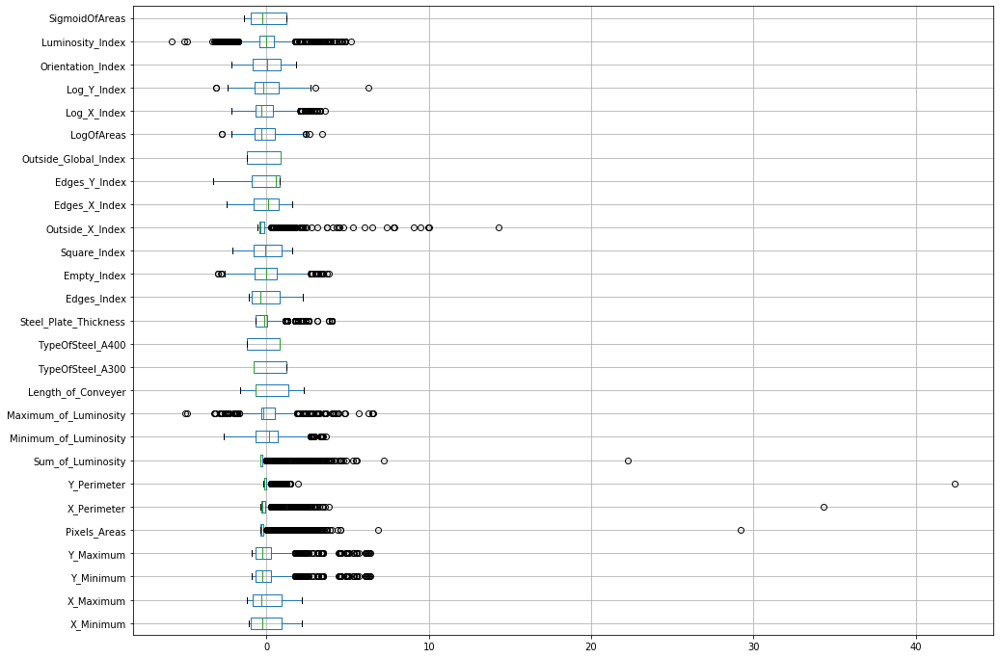

In [85]:
df_features.boxplot(return_type='dict', vert=False, figsize=(16,12))
plt.show()

In [86]:
%%markdown 
1. we could see there are some outliers in the data, so we are gonna get rid of all the outliers in the data

1. we could see there are some outliers in the data, so we are gonna get rid of all the outliers in the data


In [87]:
from collections import Counter
def find_outliers(df):
    outlier_indices = []
    for col in df.columns.tolist():
        Q1, Q3 = np.percentile(df[col],25), np.percentile(df[col],75)
        IQR = Q3 - Q1 
        threshhold = 1.5* IQR
        outlier_list = df[(df[col] < Q1 - threshhold) | (df[col] > Q3 + threshhold)].index
        outlier_indices.extend(outlier_list)
    # pick up the instance with more than 2 outliers
    multiple_outliers = list(k for k, v in Counter(outlier_indices).items() if v > 2)
    return multiple_outliers

In [88]:
outlier_indices = find_outliers(df_features)
print('The dataset contains {} observations with more than 2 outliers'.format(len(outlier_indices))) 
df = pd.concat([df_features, df_class],axis=1)
df = df.drop(outlier_indices).reset_index(drop=True)
print(df.shape)

The dataset contains 447 observations with more than 2 outliers
(1494, 34)


In [89]:
# features
X = df.iloc[:,:-7].copy()
print(X.shape)
X.head(1)

(1494, 27)


,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
0,-1.016481,-1.141639,-0.777729,-0.777729,-0.314852,-0.314996,-0.091389,-0.355537,-0.266099,-1.187708,...,-0.486227,-0.575331,0.796401,0.879804,-0.083538,-0.898437,0.528872,1.467656,-1.075752,-0.00949


In [90]:
# transform the class
from sklearn.preprocessing import LabelEncoder
# merge the target into one column. 
targets = df.iloc[:, -7:].copy()
target = (targets == 1).idxmax(1)
target.value_counts()

Other_Faults    595
Bumps           397
Z_Scratch       179
Pastry          144
Stains           72
Dirtiness        54
K_Scatch         53
dtype: int64

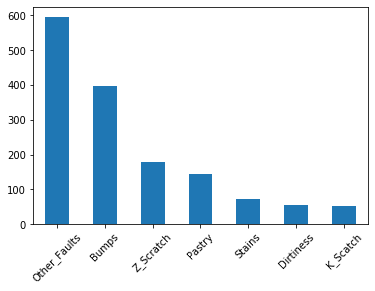

In [91]:
height=target.value_counts().plot(kind='bar', rot=45)

In [92]:
le = LabelEncoder()
le.fit(target)
# get the mapping
le_name_mapping = dict(zip(le.transform(le.classes_), le.classes_))
print(le_name_mapping)

{0: 'Bumps', 1: 'Dirtiness', 2: 'K_Scatch', 3: 'Other_Faults', 4: 'Pastry', 5: 'Stains', 6: 'Z_Scratch'}


In [93]:
y = le.transform(target)
print(y.shape)
y

(1494,)


array([4, 4, 4, ..., 3, 3, 3])

In [94]:
%%markdown
# 4. Classification
Train the data with different algorithms:
1. KNearestNeighbors
2. Logistic Regression
3. Decision Tree
4. Naive Bayes
5. Ramdom Forest

# 4. Classification
Train the data with different algorithms:
1. KNearestNeighbors
2. Logistic Regression
3. Decision Tree
4. Naive Bayes
5. Ramdom Forest


In [95]:
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report

In [96]:
n_models = 5

In [97]:
knn = KNeighborsClassifier
lr = LogisticRegression
dtc = DecisionTreeClassifier 
gnb = GaussianNB
rf = RandomForestClassifier

In [98]:
models = [knn, lr, dtc, gnb, rf]

In [99]:
model_columns = ['K_Nearest_Neighbors','Logistic_Regression','Decision_Tree','Naive_Bayes','Random_Forest']

In [100]:
def train_with_model(X_train, X_test, y_train, y_test, model):
    clf = model().fit(X_train, y_train)
    score = clf.score(X_train, y_train)
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    confusion_mats = confusion_matrix(y_test, y_pred)
    return score, accuracy, report, confusion_mats

In [101]:
def train(X_train, X_test, y_train, y_test, models):
    scores, accuracies, reports, confusion_mats = [], [], [], []
    for model in models:
        score, accuracy, report, confusion_mat = train_with_model(X_train, X_test, y_train, y_test, model)
        scores.append(score)
        accuracies.append(accuracy)
        reports.append(report)
        confusion_mats.append(confusion_mat)
    return scores, accuracies, reports, confusion_mats

In [102]:
# original split
from sklearn.model_selection import train_test_split
# set a seed and a test size for splitting the dataset 
seed = 7
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=seed)
print("{}, {}, {}".format(X.shape, X_train.shape, X_test.shape))

(1494, 27), (1045, 27), (449, 27)


In [103]:
scores, accuracies, reports, confusion_mats = train(X_train, X_test, y_train, y_test, models)

/Users/yueyuanj/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/yueyuanj/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/Users/yueyuanj/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [104]:
performance = pd.DataFrame([scores, accuracies], columns=model_columns)
performance.rename(index={0:'Score', 1:'Accuracy'}, inplace=True)
performance = performance.T * 100
performance.head()

,Score,Accuracy
K_Nearest_Neighbors,76.842105,67.706013
Logistic_Regression,68.133971,65.033408
Decision_Tree,100.000000,65.478842
Naive_Bayes,53.588517,56.347439
Random_Forest,99.138756,67.483296


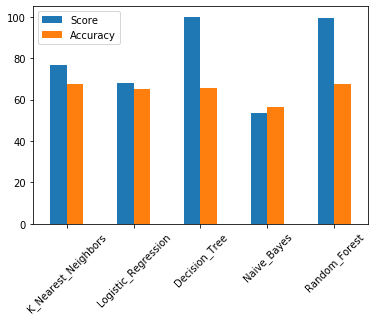

In [105]:
performance.plot(kind='bar',rot=45)
plt.show()

In [106]:
%%markdown
**Performance of 5 different models**
1. As we could see from the plot above, Decision Tree has a better score and accuracy, with score of
100% and accuracy of more than 94%.
2. To have a detailed look, we could print out their classification report and confusion matrix, shown as below.
2. Next, we are gonna dig deep in tuning the parameters of this model and try to find the best parameters of it.

**Performance of 5 different models**
1. As we could see from the plot above, Decision Tree has a better score and accuracy, with score of
100% and accuracy of more than 94%.
2. To have a detailed look, we could print out their classification report and confusion matrix, shown as below.
2. Next, we are gonna dig deep in tuning the parameters of this model and try to find the best parameters of it.


>>>  K_Nearest_Neighbors
              precision    recall  f1-score   support

           0       0.57      0.66      0.61       119
           1       0.77      0.59      0.67        17
           2       1.00      0.60      0.75        20
           3       0.68      0.68      0.68       171
           4       0.67      0.36      0.47        50
           5       0.88      0.91      0.89        23
           6       0.76      0.96      0.85        49

    accuracy                           0.68       449
   macro avg       0.76      0.68      0.70       449
weighted avg       0.69      0.68      0.67       449



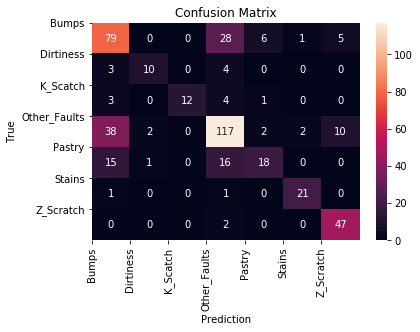

>>>  Logistic_Regression
              precision    recall  f1-score   support

           0       0.64      0.61      0.63       119
           1       0.50      0.35      0.41        17
           2       0.92      0.60      0.73        20
           3       0.59      0.69      0.64       171
           4       0.61      0.34      0.44        50
           5       1.00      0.91      0.95        23
           6       0.74      0.92      0.82        49

    accuracy                           0.65       449
   macro avg       0.71      0.63      0.66       449
weighted avg       0.65      0.65      0.64       449



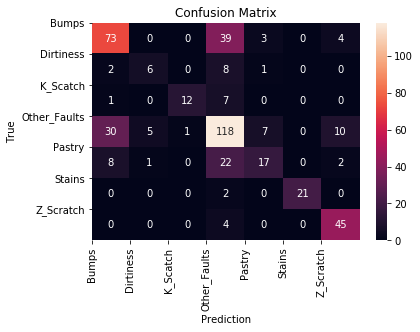

>>>  Decision_Tree
              precision    recall  f1-score   support

           0       0.60      0.50      0.55       119
           1       0.83      0.59      0.69        17
           2       0.75      0.75      0.75        20
           3       0.64      0.70      0.66       171
           4       0.52      0.50      0.51        50
           5       0.71      0.87      0.78        23
           6       0.83      0.92      0.87        49

    accuracy                           0.65       449
   macro avg       0.70      0.69      0.69       449
weighted avg       0.65      0.65      0.65       449



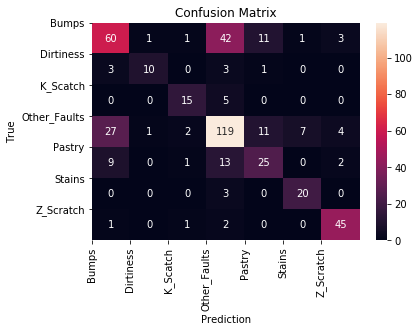

>>>  Naive_Bayes
              precision    recall  f1-score   support

           0       0.55      0.66      0.60       119
           1       0.37      0.41      0.39        17
           2       0.46      0.85      0.60        20
           3       0.72      0.29      0.42       171
           4       0.35      0.74      0.47        50
           5       0.88      0.91      0.89        23
           6       0.81      0.88      0.84        49

    accuracy                           0.56       449
   macro avg       0.59      0.68      0.60       449
weighted avg       0.63      0.56      0.55       449



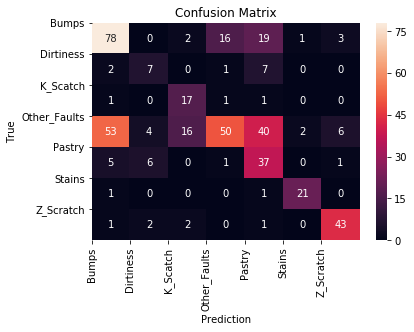

>>>  Random_Forest
              precision    recall  f1-score   support

           0       0.62      0.55      0.58       119
           1       0.83      0.59      0.69        17
           2       0.94      0.80      0.86        20
           3       0.60      0.76      0.67       171
           4       0.64      0.36      0.46        50
           5       0.95      0.87      0.91        23
           6       0.93      0.88      0.91        49

    accuracy                           0.67       449
   macro avg       0.79      0.69      0.73       449
weighted avg       0.69      0.67      0.67       449



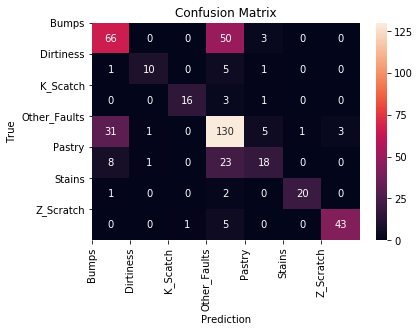

In [107]:
keys = list(le_name_mapping.keys())
values = list(le_name_mapping.values())

for i in range(n_models): 
    report = reports[i]
    column = model_columns[i]
    confusion_mat = confusion_mats[i]
    print('>>> ', column)
    print(report)
    sns.heatmap(confusion_mat,annot=True,fmt="d")
    plt.title("Confusion Matrix")
    plt.yticks(range(len(confusion_mat)), values,rotation=0)
    plt.ylabel('True')
    plt.xticks(range(len(confusion_mat)), values,rotation=90)
    plt.xlabel('Prediction')
    plt.show()

In [108]:
# Dig deep on Random Forest Classifer

In [109]:
# 1. Find out the most importort features for the current model
rf = RandomForestClassifier
clf = rf(n_estimators=100)
clf.fit(X_train,y_train)
headers = list(X_train.columns.values)
feature_imp = pd.Series(clf.feature_importances_,index=headers).sort_values(ascending=False)

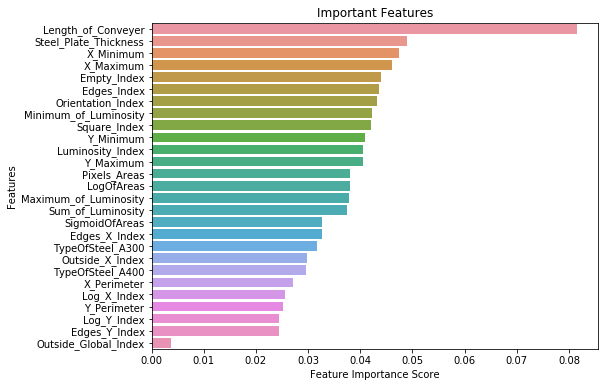

In [110]:
plt.figure(figsize=(8,6))
sns.barplot(feature_imp, feature_imp.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Important Features")
plt.show()

In [111]:
%%markdown
1. As we could see that, there is no main features exsiting that dominate the importance in this Random Forest model.

1. As we could see that, there is no main features exsiting that dominate the importance in this Random Forest model.


In [112]:
# 2. Find the best cross validation for the classifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import StratifiedShuffleSplit

In [113]:
rf = RandomForestClassifier
num_folds = 5

In [114]:
kf = KFold(n_splits=num_folds)
ss = ShuffleSplit(n_splits=num_folds)
sss = StratifiedKFold(n_splits=num_folds)
skf = StratifiedShuffleSplit(n_splits=num_folds)
cross_vals = [kf, ss, sss, skf]
cross_val_columns = ['KFold','ShuffleSplit','StratifiedKFold','StratifiedShuffleSplit']

In [115]:
for cross_val in cross_vals:
    print(cross_val)

KFold(n_splits=5, random_state=None, shuffle=False)
ShuffleSplit(n_splits=5, random_state=None, test_size=None, train_size=None)
StratifiedKFold(n_splits=5, random_state=None, shuffle=False)
StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=None,
            train_size=None)


In [116]:
def cross_validations(clf, X, y, cross_vals):
    cross_vals_score = []
    for cross_val in cross_vals:
        cross_val_score = cross_validation(clf, X, y, cross_val)
        cross_vals_score.append(cross_val_score)
    return cross_vals_score

In [117]:
def cross_validation(clf, X, y, cross_val):
    score = cross_val_score(clf, X, y, cv=cross_val)
    return score

In [118]:
cross_vals_scores = cross_validations(rf(n_estimators=10), X, y, cross_vals)

In [119]:
for i in range(len(cross_vals)):
    cross_vals_score = cross_vals_scores[i]
    column = cross_val_columns[i]
    print('>>> ', column, cross_vals_score)

>>>  KFold [0.         0.13712375 0.06020067 0.34113712 0.44630872]
>>>  ShuffleSplit [0.68       0.72666667 0.7        0.77333333 0.70666667]
>>>  StratifiedKFold [0.53488372 0.58803987 0.47491639 0.64765101 0.47457627]
>>>  StratifiedShuffleSplit [0.62       0.67333333 0.69333333 0.72666667 0.71333333]


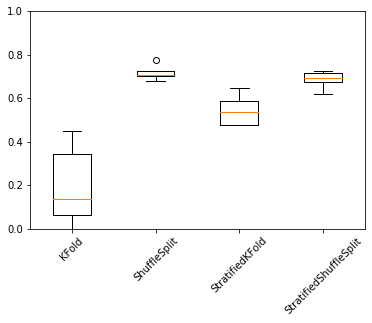

In [120]:
plt.boxplot(cross_vals_scores,labels=cross_val_columns)
plt.xticks(rotation=45)
plt.ylim([0,1])
plt.show()

In [121]:
%%markdown
1. we could see that ShuffleSplit and StratifiedShuffleSplit have good performance, both with higher mean cross val score 
and a smaller variance. In the following step, I will pick the StratifiedShuffleSplit for cross validation.

1. we could see that ShuffleSplit and StratifiedShuffleSplit have good performance, both with higher mean cross val score 
and a smaller variance. In the following step, I will pick the StratifiedShuffleSplit for cross validation.


In [122]:
# 3. Research on how the number of trees affects the performance of Random Forest Classifier
estimators = np.arange(2,100,2)
estimator_train_accuracy, estimator_test_accuracy = [], []
for k in estimators:
    clf = rf(n_estimators=k).fit(X_train,y_train)
    estimator_train_accuracy.append(clf.score(X_train, y_train))
    estimator_test_accuracy.append(clf.score(X_test, y_test))

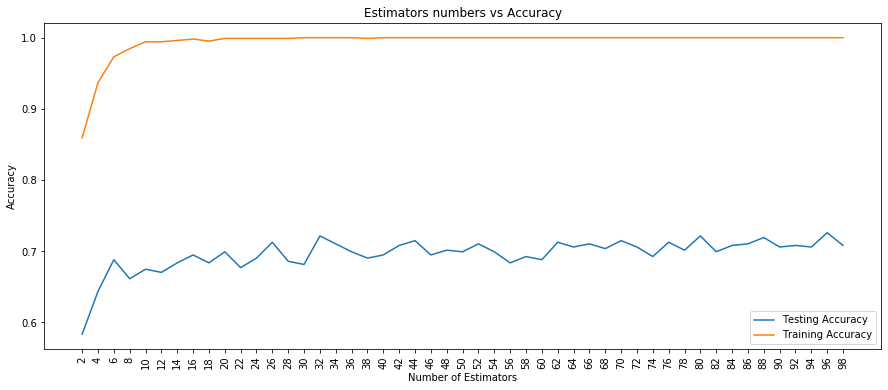

In [123]:
plt.figure(figsize=[15,6])
plt.plot(estimators, estimator_test_accuracy, label='Testing Accuracy')
plt.plot(estimators, estimator_train_accuracy, label='Training Accuracy')
plt.title('Estimators numbers vs Accuracy')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.xticks(estimators,rotation=90)
plt.legend()
plt.show()

Best accuracy is 0.7260579064587973 with number of estimators: 96
Classification report:
              precision    recall  f1-score   support

           0       0.65      0.60      0.62       119
           1       1.00      0.53      0.69        17
           2       1.00      0.70      0.82        20
           3       0.64      0.78      0.70       171
           4       0.68      0.46      0.55        50
           5       0.95      0.87      0.91        23
           6       0.88      0.94      0.91        49

    accuracy                           0.71       449
   macro avg       0.83      0.70      0.74       449
weighted avg       0.72      0.71      0.70       449



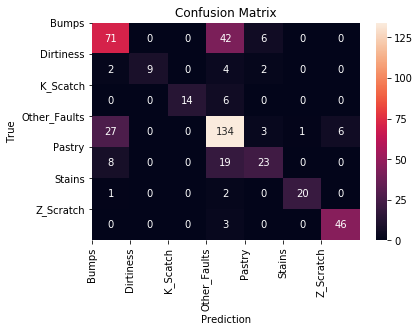

In [124]:
best_estimator_test_accuray = np.max(estimator_test_accuracy)
best_estimator_index = (1 + estimator_test_accuracy.index(np.max(estimator_test_accuracy)))*2
print("Best accuracy is {} with number of estimators: {}".format(best_estimator_test_accuray, best_estimator_index))

clf = rf(n_estimators=best_estimator_index)
y_pred = clf.fit(X_train,y_train).predict(X_test)

print('Classification report:')
print(classification_report(y_test,y_pred))
confusion_mat = confusion_matrix(y_test,y_pred)
sns.heatmap(confusion_mat,annot=True,fmt="d") 
plt.title("Confusion Matrix")
plt.yticks(range(len(confusion_mat)), values,rotation=0)
plt.ylabel('True')
plt.xticks(range(len(confusion_mat)), values,rotation=90)
plt.xlabel('Prediction')
plt.show()

In [125]:
# 4. Research on how the num of split affects the performance of Random Forest Classifier
min_samples_splits = np.arange(2,100,2)
min_samples_split_train_accuracy, min_samples_split_test_accuracy = [], []
for k in min_samples_splits:
    clf = rf(n_estimators=best_estimator_index, min_samples_split=k).fit(X_train,y_train)
    min_samples_split_train_accuracy.append(clf.score(X_train, y_train))
    min_samples_split_test_accuracy.append(clf.score(X_test, y_test))

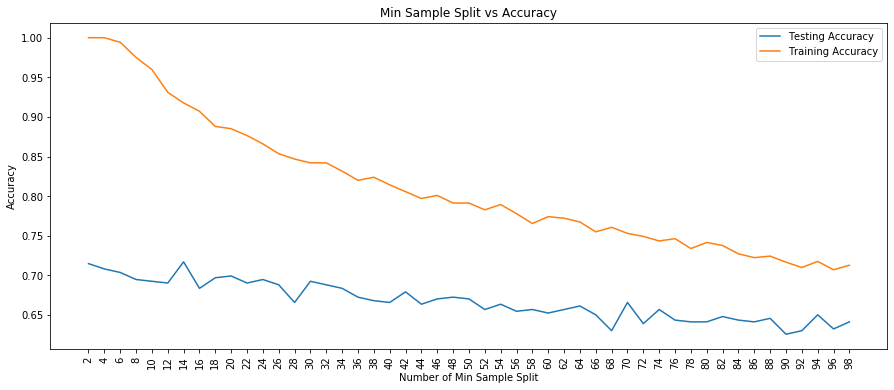

In [126]:
plt.figure(figsize=[15,6])
plt.plot(estimators, min_samples_split_test_accuracy, label='Testing Accuracy')
plt.plot(estimators, min_samples_split_train_accuracy, label='Training Accuracy')
plt.title('Min Sample Split vs Accuracy')
plt.xlabel('Number of Min Sample Split')
plt.ylabel('Accuracy')
plt.xticks(min_samples_splits,rotation=90)
plt.legend()
plt.show()

Best accuracy is 0.7171492204899778 with Min Sample Split: 14
Classification report:
              precision    recall  f1-score   support

           0       0.67      0.59      0.63       119
           1       1.00      0.53      0.69        17
           2       1.00      0.50      0.67        20
           3       0.61      0.79      0.69       171
           4       0.69      0.44      0.54        50
           5       0.95      0.87      0.91        23
           6       0.90      0.94      0.92        49

    accuracy                           0.69       449
   macro avg       0.83      0.67      0.72       449
weighted avg       0.72      0.69      0.69       449



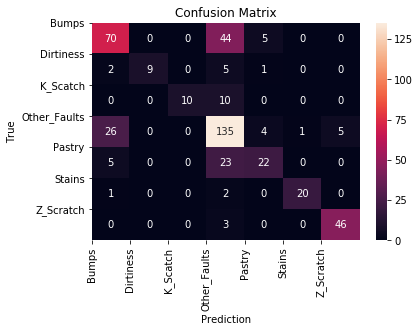

In [127]:
best_min_samples_split_test_accuray = np.max(min_samples_split_test_accuracy)
best_min_samples_split_index = (1 + min_samples_split_test_accuracy.index(np.max(min_samples_split_test_accuracy)))*2
print("Best accuracy is {} with Min Sample Split: {}".
      format(best_min_samples_split_test_accuray,best_min_samples_split_index))

clf = rf(n_estimators=best_estimator_index, min_samples_split=best_min_samples_split_index)
y_pred = clf.fit(X_train,y_train).predict(X_test)
print('Classification report:')
print(classification_report(y_test,y_pred))
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm,annot=True,fmt="d") 
plt.title("Confusion Matrix")
plt.ylabel('True')
plt.yticks(range(len(confusion_mat)),values,rotation=0)
plt.xlabel('Prediction')
plt.xticks(range(len(confusion_mat)),values,rotation=90)
plt.show()

In [128]:
%%markdown
we have find out that:
1. the best estimator number is around 41
2. the best min sample split number is around 3
3. Next we are gonna tweek search the best parameter around the near range of values. 

we have find out that:
1. the best estimator number is around 41
2. the best min sample split number is around 3
3. Next we are gonna tweek search the best parameter around the near range of values. 


In [129]:
# Finding out the best model.
from sklearn.model_selection import GridSearchCV
n_estimators = [25,30,35,40,45,50,55]
min_samples_split = [2,3,4,5,6,8,10]
parameters = {'n_estimators' : n_estimators, 
              'min_samples_split': min_samples_split
             }
rf = RandomForestClassifier(random_state=seed)
sss = StratifiedShuffleSplit(n_splits=num_folds, random_state=seed)
grid_rfc = GridSearchCV(rf, param_grid=parameters,cv=sss)
grid_rfc.fit(X_train, y_train)
# Best score and best parameters
print('>>> Best score:', grid_rfc.best_score_ * 100.0)
print('>>> Best params:', grid_rfc.best_params_)
print('>>> Best Estimators', grid_rfc.best_estimator_)

>>> Best score: 73.71428571428571
>>> Best params: {'min_samples_split': 5, 'n_estimators': 30}
>>> Best Estimators RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=30,
                       n_jobs=None, oob_score=False, random_state=7, verbose=0,
                       warm_start=False)


In [130]:
# Show the performance of he best model
best_model = grid_rfc.best_estimator_

score: 0.9971291866028709
accuray: 0.6993318485523385
report: 
               precision    recall  f1-score   support

           0       0.64      0.58      0.61       119
           1       1.00      0.65      0.79        17
           2       1.00      0.70      0.82        20
           3       0.63      0.76      0.69       171
           4       0.63      0.52      0.57        50
           5       0.95      0.87      0.91        23
           6       0.92      0.90      0.91        49

    accuracy                           0.70       449
   macro avg       0.83      0.71      0.76       449
weighted avg       0.71      0.70      0.70       449



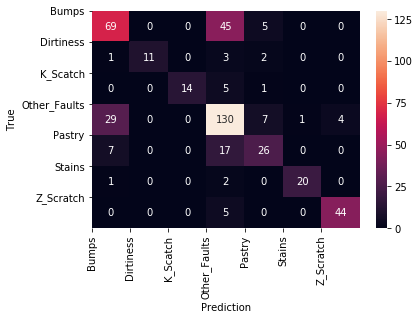

In [131]:
score = best_model.score(X_train, y_train)
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
confusion_mat = confusion_matrix(y_test, y_pred)
print('score:', score)
print('accuray:', accuracy)
print('report: \n', report)
sns.heatmap(confusion_mat,annot=True,fmt="d")
plt.yticks(range(len(confusion_mat)),values,rotation=0)
plt.ylabel('True')
plt.xticks(range(len(confusion_mat)),values,rotation=90)
plt.xlabel('Prediction')
plt.show()

In [132]:
%%markdown
We have successfully find out the best model:
1. The model is Random Forest Classifer
2. The model has score of 99% and accuracy of about 70%.
3. Some of its parameters are 'min_samples_split': 5, 'n_estimators': 30.
4. We could see from the confusion matrix that the model performs good on 5 in 7 groups 
except for the Bumps and Other Faults. It easy to understand that, since Other Faults is
a combination of all other type of fault, among which some types may have most features
the same as Bumps, that will lead to a mis classification ratio. 

We have successfully find out the best model:
1. The model is Random Forest Classifer
2. The model has score of 99% and accuracy of about 70%.
3. Some of its parameters are 'min_samples_split': 5, 'n_estimators': 30.
4. We could see from the confusion matrix that the model performs good on 5 in 7 groups 
except for the Bumps and Other Faults. It easy to understand that, since Other Faults is
a combination of all other type of fault, among which some types may have most features
the same as Bumps, that will lead to a mis classification ratio. 


In [133]:
%%markdown 
## 4. Clustering
1. Adpot a PCA on the data to reduce the dimensionality.
2. Use Kmeans to perform clustering.

## 4. Clustering
1. Adpot a PCA on the data to reduce the dimensionality.
2. Use Kmeans to perform clustering.


In [134]:
print(X.shape)
X.head(1)

(1494, 27)


,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
0,-1.016481,-1.141639,-0.777729,-0.777729,-0.314852,-0.314996,-0.091389,-0.355537,-0.266099,-1.187708,...,-0.486227,-0.575331,0.796401,0.879804,-0.083538,-0.898437,0.528872,1.467656,-1.075752,-0.00949


In [135]:
print(y.shape)
y

(1494,)


array([4, 4, 4, ..., 3, 3, 3])

In [136]:
from sklearn.decomposition import PCA
pca=PCA()
pca.fit(X)
ratio = pca.explained_variance_ratio_

In [137]:
ratio[0:16].sum()

0.997642893865549

In [138]:
ratio

array([1.96413176e-01, 1.59380957e-01, 1.23264750e-01, 1.13923413e-01,
       9.44132702e-02, 6.52030487e-02, 5.09328565e-02, 4.86087293e-02,
       4.19019169e-02, 3.63156300e-02, 2.64437128e-02, 1.45380692e-02,
       1.27660918e-02, 7.78024663e-03, 3.29676977e-03, 2.46025718e-03,
       1.25521619e-03, 5.61621829e-04, 3.43519803e-04, 1.36788947e-04,
       3.60597930e-05, 1.12225328e-05, 9.74592303e-06, 2.81433172e-06,
       1.16784608e-07, 7.42951036e-14, 1.87870346e-33])

In [139]:
# the former 16 component account for more than 99% of all features of the data.
# thus dimension set to be 16
dimensionality = 16
pca=PCA(dimensionality)
pca.fit(X)

PCA(copy=True, iterated_power='auto', n_components=16, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

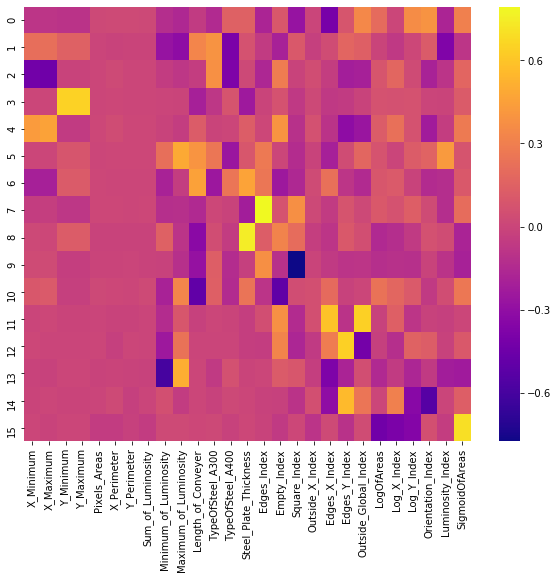

In [140]:
pca_components = pd.DataFrame(pca.components_, columns= X.columns)
plt.figure(figsize=(10,8))
sns.heatmap(pca_components, cmap='plasma')
plt.show()

In [141]:
columns = []
for i in range(0, dimensionality):
    columns.append(str(i))
data_pca = pca.fit_transform(X)
df_pca = pd.DataFrame(data_pca, columns=columns)

In [142]:
print(target.shape)

(1494,)


In [143]:
df_pca['Class'] = target

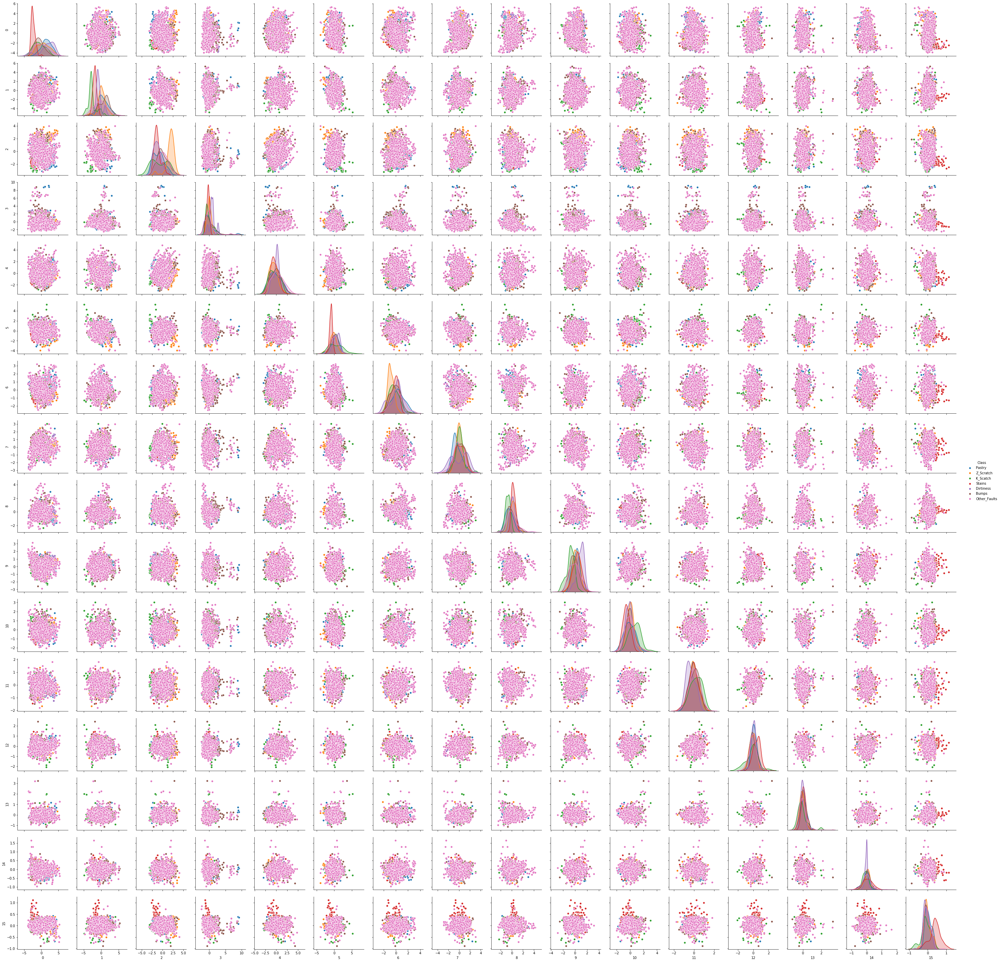

In [144]:
# see the relations between the components.
sns.pairplot(df_pca, hue='Class')
plt.show()

In [145]:
%%markdown
1. we could see from the heatmap that there are still some correlation but not as much as the original data.
2. From the pair plot, we could see that the features are more distributed than the original data.

1. we could see from the heatmap that there are still some correlation but not as much as the original data.
2. From the pair plot, we could see that the features are more distributed than the original data.


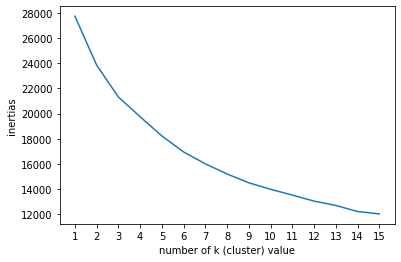

In [146]:
# Cluster with Kmeans
from sklearn.cluster import KMeans
inertias = []
for k in range(1,16):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertias.append(kmeans.inertia_) # inertia means that find to value of wcss
    
plt.plot(range(1,16),inertias)
plt.xlabel("number of k (cluster) value")
plt.xticks(range(1,16))
plt.ylabel("inertias")
plt.show()

In [147]:
%%markdown
1. The elbow appears when k is equal to 5, so in the next step I will pick number of clusters as 5.

1. The elbow appears when k is equal to 5, so in the next step I will pick number of clusters as 5.


In [148]:
kmeans = KMeans(n_clusters=5, random_state=seed).fit(X)
y_pred = kmeans.predict(X)
print('Classification Report\n', classification_report(y, y_pred))

Classification Report
               precision    recall  f1-score   support

           0       0.14      0.13      0.13       397
           1       0.02      0.13      0.03        54
           2       0.00      0.00      0.00        53
           3       0.47      0.28      0.35       595
           4       0.06      0.10      0.07       144
           5       0.00      0.00      0.00        72
           6       0.00      0.00      0.00       179

    accuracy                           0.16      1494
   macro avg       0.10      0.09      0.08      1494
weighted avg       0.23      0.16      0.18      1494



/Users/yueyuanj/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [149]:
%%markdown
1. The elbow of the number of clusters for Kmeans algorithm is around 5.
2. The Kmeans does not work so well on our dataset, with a predict accuracy of only 16%.

1. The elbow of the number of clusters for Kmeans algorithm is around 5.
2. The Kmeans does not work so well on our dataset, with a predict accuracy of only 16%.


In [150]:
# Appling mutual info regression on the features.
from sklearn.feature_selection import mutual_info_regression
arr = []
for feature in X:
    arr.append(mutual_info_regression(X, X[feature]))
    
df_mutual_infomation = pd.DataFrame(pd.np.row_stack([arr]), 
         index=X.columns.values,
        columns=X.columns.values)
df_mutual_infomation

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,...,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
X_Minimum,5.820582,3.955936,0.164117,0.164073,0.056983,0.074395,0.095126,0.079642,0.175845,0.215358,...,0.122083,0.034058,0.044852,0.073144,0.079680,0.123792,0.079944,0.092646,0.228801,0.126145
X_Maximum,3.951085,5.830817,0.182006,0.182150,0.078827,0.077319,0.092774,0.066170,0.172767,0.178557,...,0.130660,0.029862,0.065374,0.064062,0.074708,0.141995,0.091194,0.102344,0.234986,0.109653
Y_Minimum,0.163279,0.181877,6.052593,6.047684,0.078866,0.032734,0.079384,0.101439,0.139811,0.050347,...,0.062570,0.051614,0.044439,0.000000,0.102916,0.026621,0.063360,0.077790,0.099137,0.039046
Y_Maximum,0.164254,0.182086,6.047684,6.052537,0.080094,0.034276,0.085943,0.101408,0.134104,0.055683,...,0.060481,0.050870,0.044520,0.000000,0.102827,0.024293,0.067229,0.078523,0.099446,0.039915
Pixels_Areas,0.058341,0.077182,0.082938,0.082974,5.477086,0.640385,0.953778,1.957520,0.147409,0.031891,...,0.285248,0.296899,0.071236,0.047871,5.229093,0.300637,0.792234,0.282858,0.086439,1.469580
X_Perimeter,0.075567,0.085208,0.026526,0.026706,0.626240,4.065589,0.587247,0.628736,0.061701,0.053541,...,0.667241,1.292881,0.247087,0.026111,0.609835,0.667518,0.385243,0.217815,0.045354,0.852798
Y_Perimeter,0.092614,0.081633,0.080830,0.080754,0.960924,0.590538,4.031632,0.933757,0.096333,0.067145,...,0.192030,0.521480,0.481891,0.144226,0.963489,0.198172,2.168700,0.800787,0.100391,1.310682
Sum_of_Luminosity,0.080272,0.066741,0.101483,0.101490,1.961240,0.631992,0.931368,6.046959,0.105825,0.067310,...,0.316472,0.273184,0.096937,0.059502,1.906056,0.316317,0.705361,0.266423,0.085490,1.378273
Minimum_of_Luminosity,0.178643,0.164064,0.135241,0.134628,0.137894,0.051919,0.087748,0.103884,4.364538,0.567139,...,0.086852,0.053789,0.088364,0.085795,0.140419,0.120585,0.127858,0.096393,1.185048,0.107058
Maximum_of_Luminosity,0.215469,0.186041,0.056474,0.056502,0.025233,0.045541,0.041389,0.064699,0.549123,3.445343,...,0.030098,0.023038,0.053626,0.045831,0.046430,0.029778,0.075714,0.066337,1.017675,0.052869


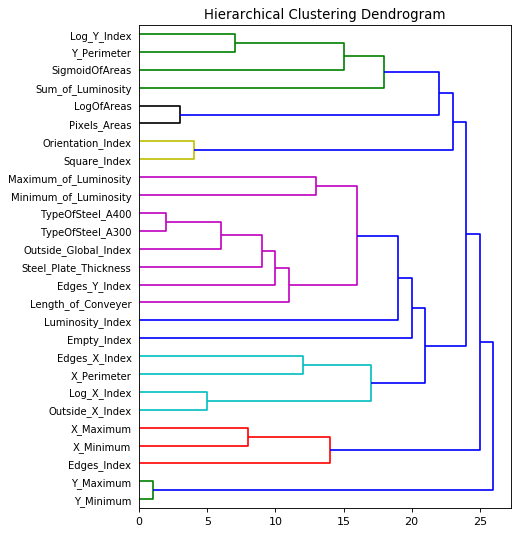

In [151]:
from scipy.cluster.hierarchy import dendrogram 
def plot_dendrogram(model, ** kwargs):
    children = model.children_ 
    dist = np.arange(children.shape[0])+1 
    n_obs = np.arange(2, children.shape[0]+2) 
    linkage_matrix = np.column_stack([children, dist, n_obs]) 
    dendrogram(linkage_matrix.astype(float), ** kwargs)
    
from sklearn.cluster import AgglomerativeClustering
model = AgglomerativeClustering(n_clusters=27)
model = model.fit(df_mutual_infomation)

figure = plt.figure(figsize=(6,8), dpi=80)
labels = df_mutual_infomation.columns.values
plt.title('Hierarchical Clustering Dendrogram')
plot_dendrogram(model, labels=labels, orientation='right', leaf_font_size=9)
plt.show()

In [152]:
%%markdown
1. The Dendrogram does show us the similirities between the features.
2. The pattersn do make sense to me, since most of them are what we found in the 2nd step of exploring the data.

1. The Dendrogram does show us the similirities between the features.
2. The pattersn do make sense to me, since most of them are what we found in the 2nd step of exploring the data.


In [153]:
%%markdown
Next step:
1. Working on a callable service to make it easier for others to leverage my work.

Next step:
1. Working on a callable service to make it easier for others to leverage my work.


In [154]:
%%markdown
## 6. Callable Interface

## 6. Callable Interface


In [155]:
from sklearn.externals import joblib
print('Training a Decision Tree classifier')
clf = RandomForestClassifier(min_samples_split=5, n_estimators=30)
clf.fit(X, y)

print('Exporting the trained model')
joblib.dump(clf, 'model/steel_plate_fault_classifier.joblib')

Training a Decision Tree classifier
Exporting the trained model


/Users/yueyuanj/anaconda3/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


['model/steel_plate_fault_classifier.joblib']